In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.gridspec as gridspec
import time
from tensorflow.python.layers.base import Layer

/opt/conda/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)
/opt/conda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
from tensorflow.examples.tutorials.mnist import input_data
mnist = input_data.read_data_sets("mnist/")
num_train=mnist.train.num_examples
num_val=mnist.validation.num_examples
num_test=mnist.test.num_examples

Extracting mnist/train-images-idx3-ubyte.gz
Extracting mnist/train-labels-idx1-ubyte.gz
Extracting mnist/t10k-images-idx3-ubyte.gz
Extracting mnist/t10k-labels-idx1-ubyte.gz


In [3]:
width=28
height=28
channel=1

In [4]:
tf.reset_default_graph()
X=tf.placeholder(dtype=tf.float32,shape=[None,height*width*channel],name='input_image')
y=tf.placeholder(dtype=tf.int32,shape=[None])

mask_psed_neg=tf.reshape(tf.cast(tf.equal(y,1),tf.float32),(-1,1))
mask_not_psed_neg=tf.reshape(tf.cast(tf.logical_not(tf.equal(y,1)),tf.float32),(-1,1))

y_onehot=tf.one_hot(y,3)

class CNN_bn_Classifier(Layer):
    def __init__(self):
        self.conv1=tf.layers.Conv2D(filters=64,kernel_size=3,strides=1,padding='same',activation=tf.nn.relu,name='conv1',_reuse=tf.AUTO_REUSE)
        self.conv2=tf.layers.Conv2D(filters=64,kernel_size=3,strides=1,padding='same',activation=tf.nn.relu,name='conv2',_reuse=tf.AUTO_REUSE)
        self.conv3=tf.layers.Conv2D(filters=64,kernel_size=3,strides=1,padding='same',activation=tf.nn.relu,name='conv3',_reuse=tf.AUTO_REUSE)
        self.batch_norm1=tf.layers.BatchNormalization(axis=3,name='bn1',_reuse=tf.AUTO_REUSE)
        self.batch_norm2=tf.layers.BatchNormalization(axis=3,name='bn2',_reuse=tf.AUTO_REUSE)
        self.batch_norm3=tf.layers.BatchNormalization(axis=3,name='bn3',_reuse=tf.AUTO_REUSE)
        self.max_pool=tf.layers.MaxPooling2D(pool_size=2,strides=2,_reuse=tf.AUTO_REUSE)
        self.fc=tf.layers.Dense(units=3,_reuse=tf.AUTO_REUSE)
    
    def __call__(self,inputs,is_training):
        out1=self.max_pool(self.batch_norm1(self.conv1(inputs),training=is_training))
        out2=self.max_pool(self.batch_norm2(self.conv2(out1),training=is_training))
        out3=self.max_pool(self.batch_norm3(self.conv3(out2),training=is_training))
        score=self.fc(tf.layers.flatten(out3))
        return score
    
class CNN_Classifier(Layer):
    def __init__(self):
        self.conv1=tf.layers.Conv2D(filters=64,kernel_size=3,strides=1,padding='same',activation=tf.nn.relu,name='conv1',_reuse=tf.AUTO_REUSE)
        self.conv2=tf.layers.Conv2D(filters=64,kernel_size=3,strides=1,padding='same',activation=tf.nn.relu,name='conv2',_reuse=tf.AUTO_REUSE)
        self.conv3=tf.layers.Conv2D(filters=64,kernel_size=3,strides=1,padding='same',activation=tf.nn.relu,name='conv3',_reuse=tf.AUTO_REUSE)
        self.max_pool=tf.layers.MaxPooling2D(pool_size=2,strides=2,_reuse=tf.AUTO_REUSE)
        self.avg_pool=tf.layers.AveragePooling2D(pool_size=7,strides=7,_reuse=tf.AUTO_REUSE)
        self.fc=tf.layers.Dense(units=3,_reuse=tf.AUTO_REUSE)
    
    def __call__(self,inputs):
        out1=self.max_pool(self.conv1(inputs))
        out2=self.max_pool(self.conv2(out1))
        out3=self.avg_pool(self.conv3(out2))
        score=self.fc(tf.layers.flatten(out3))
        return score
    
class NN_Classifier(Layer):
    def __init__(self):
        self.linear1=tf.layers.Dense(units=512,name='linear1',activation=tf.nn.relu,_reuse=tf.AUTO_REUSE)
        self.linear2=tf.layers.Dense(units=256,name='linear2',activation=tf.nn.relu,_reuse=tf.AUTO_REUSE)
        self.linear3=tf.layers.Dense(units=256,name='linear3',activation=tf.nn.relu,_reuse=tf.AUTO_REUSE)
        self.linear4=tf.layers.Dense(units=3,name='linear4',_reuse=tf.AUTO_REUSE)
    
    def __call__(self,inputs):
        score=self.linear4(self.linear3(self.linear2(self.linear1(inputs))))
#         score=self.linear4(self.linear1(inputs))
        return score    

    
class VAE(Layer):
    def __init__(self):
        self.lstm_hidden_dim=256
        self.latent_dim=16
        self.n_time=10
        self.encoder_lstm=tf.contrib.rnn.LSTMCell(self.lstm_hidden_dim)
        self.decoder_lstm=tf.contrib.rnn.LSTMCell(self.lstm_hidden_dim)
        self.encode_mean=tf.layers.Dense(units=self.latent_dim,name='encode_mean')   # calculate mean of z
        self.encode_std=tf.layers.Dense(units=self.latent_dim,name='encode_std')   # calculate std of z
        self.unit_gaussian=tf.distributions.Normal(loc=tf.zeros(self.latent_dim),scale=tf.ones(self.latent_dim))
        self.emit_net=tf.layers.Dense(units=height*width*channel,name='emit_net')
        
        
    def __call__(self,inputs):
        batch_size=tf.shape(inputs)[0]
        state_encode=self.encoder_lstm.zero_state(batch_size, tf.float32)   # lstm tuple (c,h)
        state_decode=self.decoder_lstm.zero_state(batch_size, tf.float32)   # lstm tuple (c,h)
        original_image=tf.layers.flatten(inputs)
        output_image=None
        latent_loss_his=[]
        classifier_loss_his=[]
        likelihood_his=[]
        predict_his=[]
        image_his=[]
        
        for t in range(self.n_time):
            if t==0:
                image=original_image
            else:
                # use output_image for fake images, use original image for real image
                image=mask_psed_neg*output_image+mask_not_psed_neg*original_image
            image_his.append(image)
            '''
            Part I: Classifier
            '''
            classifier_scope="CNN_classifier_"+str(t)
#             input_image=tf.reshape(image,(-1,height,width,channel))
            input_image=tf.reshape(image,(-1,height*width*channel))
            with tf.variable_scope(classifier_scope) as vs:
#                 classifier=CNN_Classifier()
#                 score_likelihood=classifier(input_image)
                classifier=NN_Classifier()
                score_likelihood=classifier(input_image)
            with tf.variable_scope(classifier_scope) as vs:
#                 classifier=CNN_Classifier()
#                 score_classifier=classifier(tf.stop_gradient(input_image))
                classifier=NN_Classifier()
                score_classifier=classifier(tf.stop_gradient(input_image))
            
            score_likelihood=tf.reshape(score_likelihood[:,0]-score_likelihood[:,1],(-1,1))*mask_psed_neg
            likelihood_his.append(score_likelihood) # only record score for fake images
            classifier_loss_his.append(tf.losses.softmax_cross_entropy(logits=score_classifier,onehot_labels=y_onehot))
            predict_his.append(score_classifier)
            
            '''
            Part II: Recurrent VAE
            '''
            # add noise
#             image+=tf.random_normal(shape=tf.shape(image),mean=0.0,stddev=0.1)
#             image=tf.clip_by_value(image,clip_value_min=0.0,clip_value_max=1.0)
            with tf.variable_scope("pre_encoder") as vs:
                image=tf.layers.dense(image,units=512,activation=tf.nn.relu,name='dense_preencoder',reuse=tf.AUTO_REUSE)
            with tf.variable_scope("LSTM_encoder") as vs:
                encode_out,state_encode=self.encoder_lstm(image,state_encode)
            z_mean=self.encode_mean(encode_out)
            z_std=tf.exp(self.encode_std(encode_out))
            distrib_encode=tf.distributions.Normal(loc=z_mean,scale=z_std)
            Z=distrib_encode.sample()
            
            latent_loss=tf.reduce_sum(mask_psed_neg*tf.distributions.kl_divergence(distrib_encode,self.unit_gaussian),axis=1)
            latent_loss_his.append(latent_loss)
            
            with tf.variable_scope("LSTM_decoder") as vs:
                decode_out,state_decode=self.decoder_lstm(Z,state_decode)
                
            output_image=self.emit_net(decode_out)
            
        tot_latent_loss=tf.reduce_mean(latent_loss_his)
        tot_classifier_loss=tf.reduce_mean(classifier_loss_his)
        tot_likelihood_loss=tf.reduce_sum(likelihood_his,axis=0)  # accumulate score through time
        tot_likelihood_loss=tf.reduce_mean(-tot_likelihood_loss)
        
        tot_loss=tot_latent_loss+tot_classifier_loss+tot_likelihood_loss
            
        return image_his,tot_loss,tot_latent_loss,tot_classifier_loss,tot_likelihood_loss,predict_his


vae=VAE()
image_his,tot_loss,tot_latent_loss,tot_classifier_loss,tot_likelihood_loss,predict_his=vae(X)
tot_classifier_loss=tot_classifier_loss
tot_loss2=tot_latent_loss+tot_likelihood_loss

optimizier1=tf.train.AdamOptimizer(learning_rate=1e-3)
train_step1 = optimizier1.minimize(tot_classifier_loss)
optimizier2=tf.train.RMSPropOptimizer(learning_rate=1e-4)
train_step2 = optimizier2.minimize(tot_loss2)

# optimizier3=tf.train.AdamOptimizer(learning_rate=1e-3)
# train_step3 = optimizier3.minimize(tot_loss)

# extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)

In [5]:
# Generate process
G_batch_size=tf.placeholder(shape=(),dtype=tf.int32,name='batch_size')
G_state_decode=vae.decoder_lstm.zero_state(G_batch_size, tf.float32)
G_unit_gaussian=tf.distributions.Normal(loc=tf.zeros((G_batch_size,vae.latent_dim)),scale=tf.ones((G_batch_size,vae.latent_dim)))

G_output_his=[]

for t in range(vae.n_time):
    G_Z=G_unit_gaussian.sample()
    with tf.variable_scope("LSTM_decoder") as vs:
        G_decode_out,G_state_decode=vae.decoder_lstm(G_Z,G_state_decode)
    G_output_image=vae.emit_net(G_decode_out)
    G_output_his.append(G_output_image)
G_output_result=G_output_his[-1]

In [6]:
def display():
    output_images=sess.run(G_output_result,feed_dict={G_batch_size:9})  # (9,784)
    
    plt.figure(figsize = (3,3))
    gs1 = gridspec.GridSpec(3,3)
    gs1.update(wspace=0.025, hspace=0.05)

    for i in range(9):
        plt.subplot(gs1[i])
        plt.imshow(output_images[i,:].reshape(28,28))
        plt.axis('off')
#     plt.savefig('a.png')
    plt.show()

In [7]:
def make_batch(batch_size,fake_size,noise_size):
    X_true,_=mnist.train.next_batch(batch_size)
    X_fake=np.random.uniform(low=0,high=1,size=(fake_size,height*width*channel))
    X_noise=np.random.uniform(low=0,high=1,size=(noise_size,height*width*channel))
    image=np.vstack((X_true,X_fake,X_noise))
    label=np.concatenate((np.zeros(batch_size),np.ones(fake_size),2*np.ones(noise_size)))
    return image,label

def make_batch_new(batch_size,fake_size):
    X_true,_=mnist.train.next_batch(batch_size)
    X_fake=np.random.uniform(low=0,high=1,size=(fake_size,height*width*channel))
    X_noise=X_true+np.random.normal(loc=0.0,scale=1.0,size=(batch_size,height*width*channel))
    image=np.vstack((X_true,X_fake,X_noise))
    label=np.concatenate((np.zeros(batch_size),np.ones(fake_size),2*np.ones(noise_size)))
    return image,label

2018-05-17 22:15:22 iteration 1/50000: current training loss = 1.196763 (=0.034937+1.087204+0.074622)


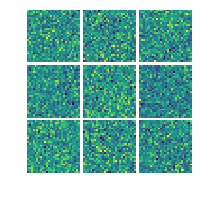

2018-05-17 22:15:34 iteration 100/50000: current training loss = 32.970856 (=1.659742+0.009259+31.301855)


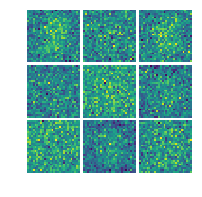

2018-05-17 22:15:46 iteration 200/50000: current training loss = 32.490875 (=2.425722+0.030479+30.034674)


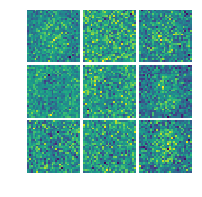

2018-05-17 22:15:59 iteration 300/50000: current training loss = 42.387718 (=2.032928+0.036030+40.318760)


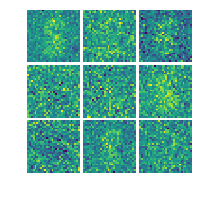

2018-05-17 22:16:11 iteration 400/50000: current training loss = 31.849047 (=3.501387+0.022485+28.325174)


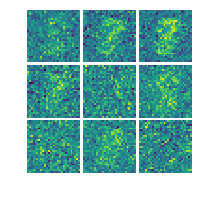

2018-05-17 22:16:23 iteration 500/50000: current training loss = 47.955254 (=2.262215+0.010884+45.682156)


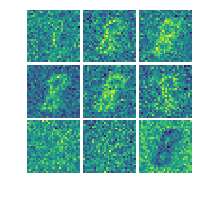

2018-05-17 22:16:35 iteration 600/50000: current training loss = 21.299126 (=2.616214+0.016314+18.666597)


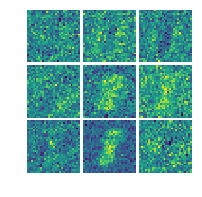

2018-05-17 22:16:48 iteration 700/50000: current training loss = 22.346270 (=3.473287+0.025891+18.847092)


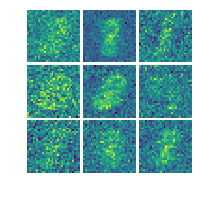

2018-05-17 22:17:00 iteration 800/50000: current training loss = 26.152031 (=3.835629+0.082273+22.234129)


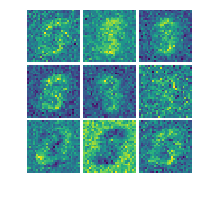

2018-05-17 22:17:12 iteration 900/50000: current training loss = 25.399475 (=2.765956+0.009646+22.623873)


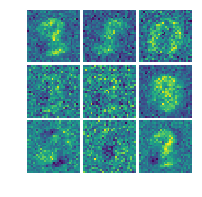

2018-05-17 22:17:25 iteration 1000/50000: current training loss = 44.986870 (=2.628172+0.050064+42.308632)


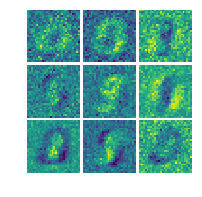

2018-05-17 22:17:35 iteration 1100/50000: current training loss = 29.669550 (=3.398666+0.106190+26.164694)


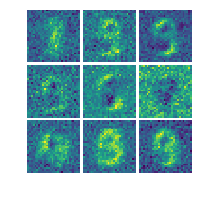

2018-05-17 22:17:45 iteration 1200/50000: current training loss = 14.946655 (=3.146346+0.117299+11.683009)


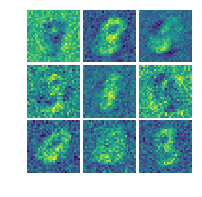

2018-05-17 22:17:56 iteration 1300/50000: current training loss = 12.592181 (=2.308449+0.120894+10.162838)


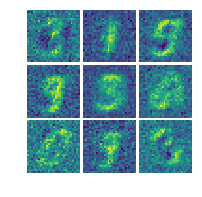

2018-05-17 22:18:06 iteration 1400/50000: current training loss = 13.482323 (=2.806879+0.274254+10.401191)


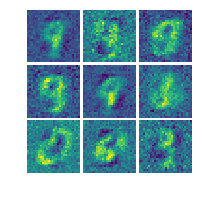

2018-05-17 22:18:16 iteration 1500/50000: current training loss = 13.425110 (=1.643037+0.240258+11.541814)


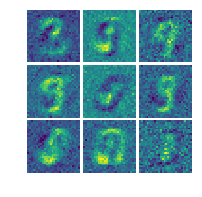

2018-05-17 22:18:26 iteration 1600/50000: current training loss = 15.471317 (=1.953504+0.280036+13.237778)


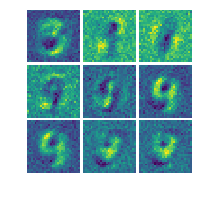

2018-05-17 22:18:36 iteration 1700/50000: current training loss = 10.302270 (=2.011187+0.288286+8.002797)


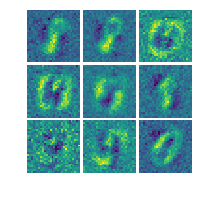

2018-05-17 22:18:46 iteration 1800/50000: current training loss = 14.266784 (=2.275980+0.488866+11.501938)


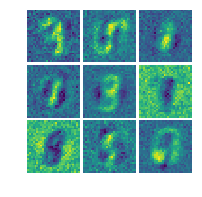

2018-05-17 22:18:57 iteration 1900/50000: current training loss = 11.039659 (=1.731827+0.317328+8.990503)


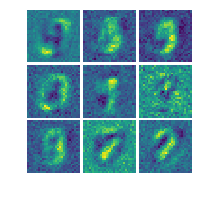

2018-05-17 22:19:07 iteration 2000/50000: current training loss = 37.870010 (=1.936024+0.323341+35.610645)


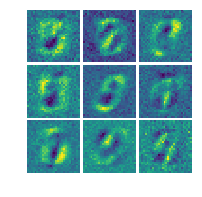

2018-05-17 22:19:17 iteration 2100/50000: current training loss = 25.944887 (=1.514669+0.366587+24.063631)


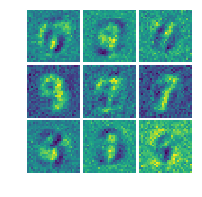

2018-05-17 22:19:27 iteration 2200/50000: current training loss = 9.498693 (=1.475950+0.303159+7.719583)


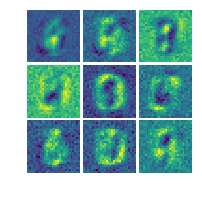

2018-05-17 22:19:36 iteration 2300/50000: current training loss = 19.889631 (=1.527185+0.323584+18.038862)


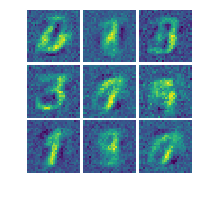

2018-05-17 22:19:46 iteration 2400/50000: current training loss = 19.020597 (=1.402700+0.415267+17.202631)


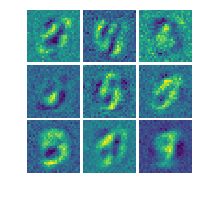

2018-05-17 22:19:56 iteration 2500/50000: current training loss = 22.871264 (=1.291424+0.382692+21.197147)


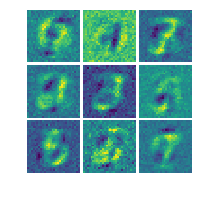

2018-05-17 22:20:05 iteration 2600/50000: current training loss = 28.973911 (=1.486654+0.365250+27.122007)


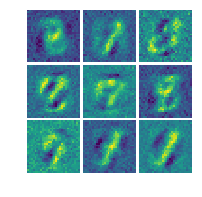

2018-05-17 22:20:15 iteration 2700/50000: current training loss = 22.004532 (=1.196806+0.417325+20.390402)


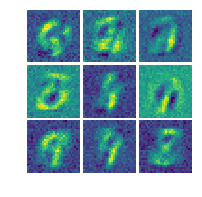

2018-05-17 22:20:25 iteration 2800/50000: current training loss = 10.401649 (=1.022388+0.378094+9.001166)


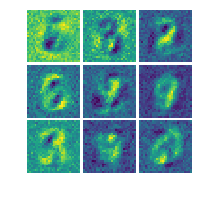

2018-05-17 22:20:34 iteration 2900/50000: current training loss = 8.221344 (=1.091132+0.402219+6.727993)


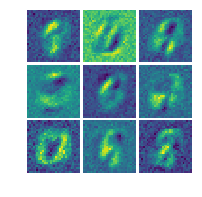

2018-05-17 22:20:44 iteration 3000/50000: current training loss = 12.735561 (=0.890960+0.352359+11.492244)


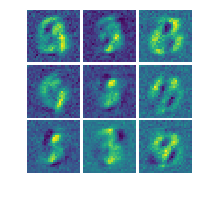

2018-05-17 22:20:54 iteration 3100/50000: current training loss = 15.337811 (=0.966774+0.373628+13.997409)


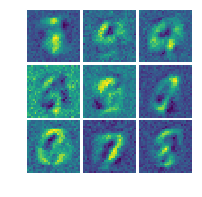

2018-05-17 22:21:04 iteration 3200/50000: current training loss = 18.224709 (=0.659406+0.339894+17.225409)


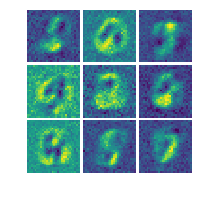

2018-05-17 22:21:14 iteration 3300/50000: current training loss = 13.289231 (=0.868517+0.407999+12.012715)


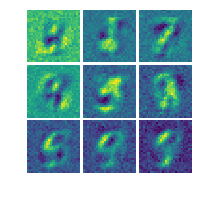

2018-05-17 22:21:24 iteration 3400/50000: current training loss = 12.650094 (=1.415736+0.396430+10.837928)


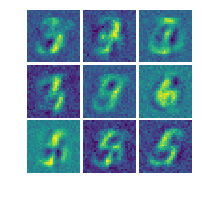

2018-05-17 22:21:33 iteration 3500/50000: current training loss = 8.534790 (=1.263532+0.596135+6.675123)


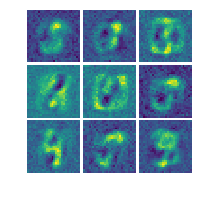

2018-05-17 22:21:43 iteration 3600/50000: current training loss = 11.083011 (=0.972732+0.392624+9.717654)


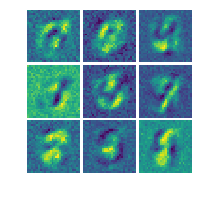

2018-05-17 22:21:53 iteration 3700/50000: current training loss = 9.924023 (=0.825304+0.356156+8.742562)


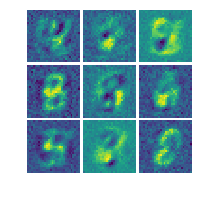

2018-05-17 22:22:03 iteration 3800/50000: current training loss = 10.833295 (=1.097611+0.408704+9.326980)


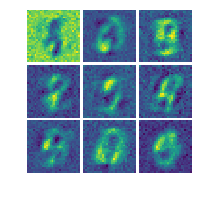

2018-05-17 22:22:13 iteration 3900/50000: current training loss = 13.299835 (=0.781602+0.406467+12.111767)


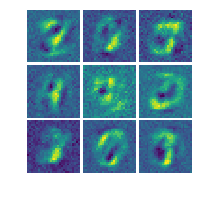

2018-05-17 22:22:23 iteration 4000/50000: current training loss = 7.950405 (=0.972961+0.372632+6.604812)


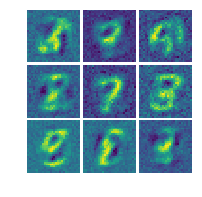

2018-05-17 22:22:33 iteration 4100/50000: current training loss = 9.505232 (=0.821855+0.460984+8.222393)


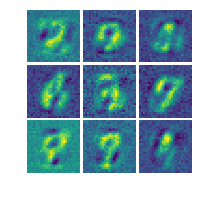

2018-05-17 22:22:43 iteration 4200/50000: current training loss = 11.187986 (=0.770477+0.367804+10.049706)


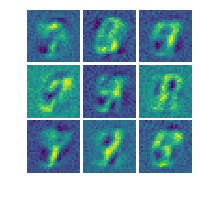

2018-05-17 22:22:53 iteration 4300/50000: current training loss = 31.572620 (=1.133345+0.440618+29.998657)


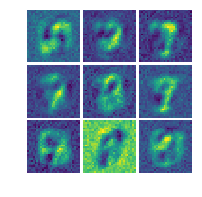

2018-05-17 22:23:03 iteration 4400/50000: current training loss = 27.213072 (=0.759797+0.368122+26.085154)


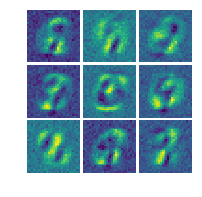

2018-05-17 22:23:13 iteration 4500/50000: current training loss = 8.480928 (=0.782755+0.337396+7.360777)


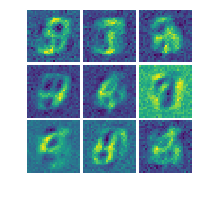

2018-05-17 22:23:24 iteration 4600/50000: current training loss = 12.309853 (=0.668265+0.371729+11.269859)


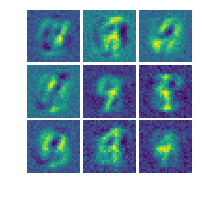

2018-05-17 22:23:34 iteration 4700/50000: current training loss = 11.255070 (=0.891833+0.335104+10.028133)


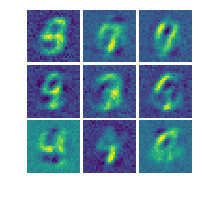

2018-05-17 22:23:44 iteration 4800/50000: current training loss = 10.740302 (=1.051680+0.366162+9.322460)


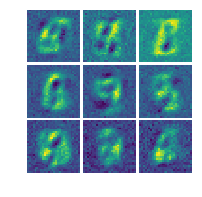

2018-05-17 22:23:55 iteration 4900/50000: current training loss = 21.634075 (=0.866146+0.340227+20.427702)


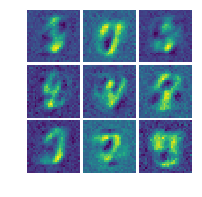

2018-05-17 22:24:05 iteration 5000/50000: current training loss = 10.461020 (=0.932279+0.437037+9.091704)


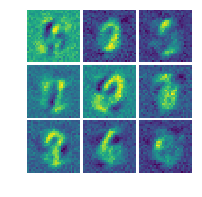

2018-05-17 22:24:15 iteration 5100/50000: current training loss = 29.717260 (=0.898372+0.309128+28.509760)


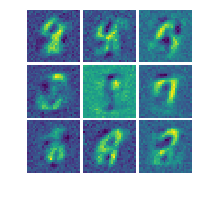

2018-05-17 22:24:25 iteration 5200/50000: current training loss = 21.771959 (=0.980062+0.387126+20.404772)


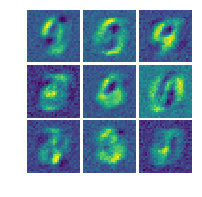

2018-05-17 22:24:35 iteration 5300/50000: current training loss = 12.468831 (=1.071182+0.399190+10.998459)


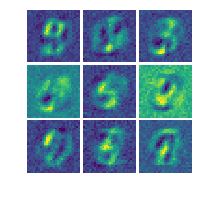

2018-05-17 22:24:45 iteration 5400/50000: current training loss = 9.783215 (=0.810036+0.337805+8.635373)


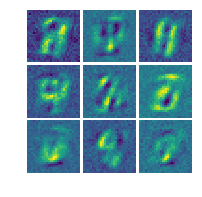

2018-05-17 22:24:54 iteration 5500/50000: current training loss = 10.007170 (=1.020252+0.493999+8.492919)


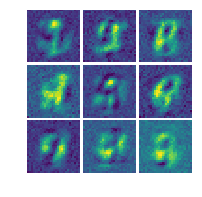

2018-05-17 22:25:04 iteration 5600/50000: current training loss = 17.805237 (=0.947954+0.394112+16.463171)


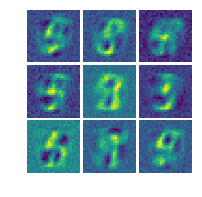

2018-05-17 22:25:14 iteration 5700/50000: current training loss = 8.879485 (=0.977418+0.340267+7.561800)


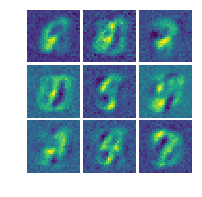

2018-05-17 22:25:23 iteration 5800/50000: current training loss = 8.496990 (=1.236258+0.389903+6.870829)


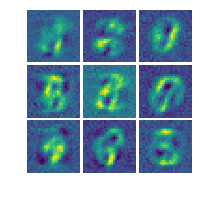

2018-05-17 22:25:33 iteration 5900/50000: current training loss = 8.144085 (=0.958434+0.372208+6.813442)


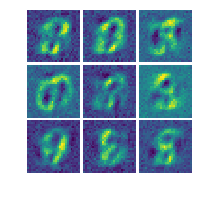

2018-05-17 22:25:43 iteration 6000/50000: current training loss = 8.611848 (=0.623766+0.329535+7.658547)


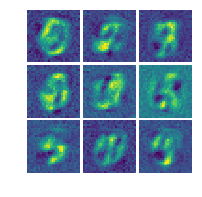

2018-05-17 22:25:53 iteration 6100/50000: current training loss = 6.868834 (=1.280104+0.448976+5.139754)


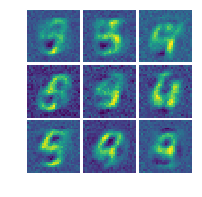

2018-05-17 22:26:03 iteration 6200/50000: current training loss = 7.620292 (=0.710453+0.370918+6.538921)


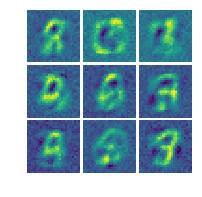

2018-05-17 22:26:13 iteration 6300/50000: current training loss = 7.042780 (=0.808402+0.379174+5.855204)


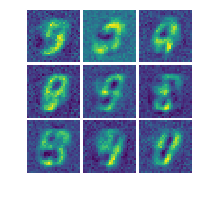

2018-05-17 22:26:22 iteration 6400/50000: current training loss = 8.026802 (=1.202983+0.351518+6.472301)


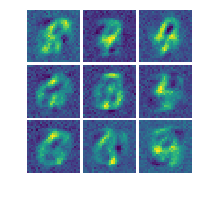

2018-05-17 22:26:32 iteration 6500/50000: current training loss = 9.447799 (=0.833826+0.402279+8.211694)


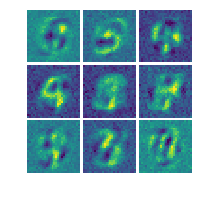

2018-05-17 22:26:42 iteration 6600/50000: current training loss = 6.835852 (=1.041126+0.381038+5.413688)


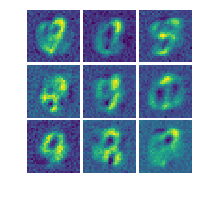

2018-05-17 22:26:51 iteration 6700/50000: current training loss = 7.159580 (=0.781699+0.370622+6.007259)


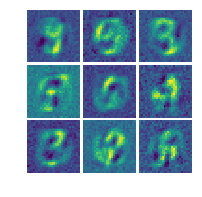

2018-05-17 22:27:01 iteration 6800/50000: current training loss = 7.700372 (=1.053143+0.336121+6.311108)


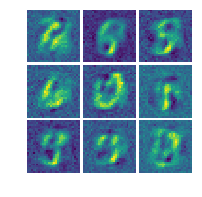

2018-05-17 22:27:11 iteration 6900/50000: current training loss = 7.683106 (=1.009459+0.395336+6.278311)


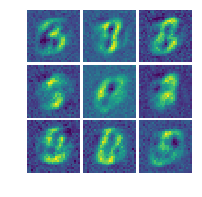

2018-05-17 22:27:21 iteration 7000/50000: current training loss = 8.097526 (=0.823109+0.330626+6.943791)


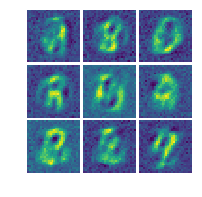

2018-05-17 22:27:30 iteration 7100/50000: current training loss = 7.439677 (=1.339210+0.324427+5.776041)


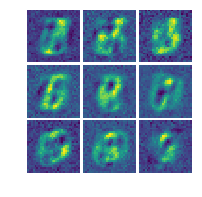

2018-05-17 22:27:40 iteration 7200/50000: current training loss = 5.876173 (=0.919176+0.420164+4.536833)


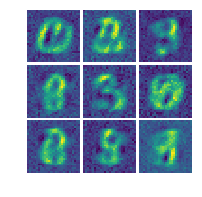

2018-05-17 22:27:49 iteration 7300/50000: current training loss = 11.098829 (=0.977188+0.397046+9.724595)


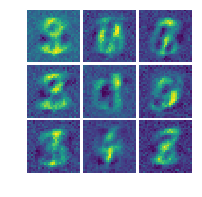

2018-05-17 22:27:59 iteration 7400/50000: current training loss = 13.286269 (=1.005026+0.294353+11.986890)


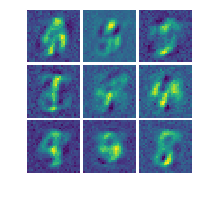

2018-05-17 22:28:09 iteration 7500/50000: current training loss = 8.932241 (=1.155224+0.337669+7.439350)


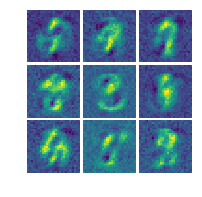

2018-05-17 22:28:18 iteration 7600/50000: current training loss = 15.774967 (=1.117547+0.422768+14.234653)


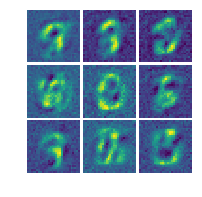

2018-05-17 22:28:28 iteration 7700/50000: current training loss = 35.869919 (=0.812028+0.353723+34.704166)


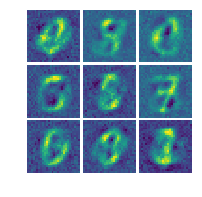

2018-05-17 22:28:38 iteration 7800/50000: current training loss = 13.152419 (=0.901054+0.344371+11.906995)


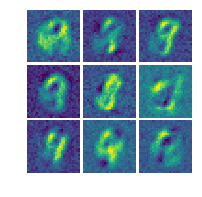

2018-05-17 22:28:48 iteration 7900/50000: current training loss = 11.786148 (=1.159021+0.351978+10.275149)


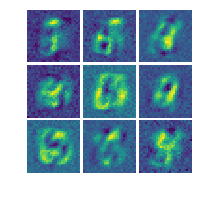

2018-05-17 22:28:57 iteration 8000/50000: current training loss = 7.254991 (=1.053077+0.400172+5.801741)


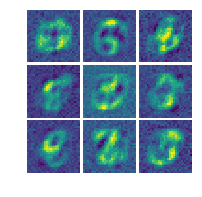

2018-05-17 22:29:07 iteration 8100/50000: current training loss = 18.025139 (=0.753202+0.326585+16.945353)


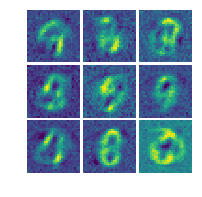

2018-05-17 22:29:17 iteration 8200/50000: current training loss = 18.645924 (=0.734388+0.390830+17.520704)


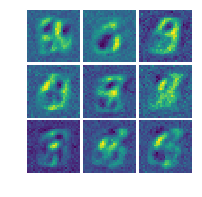

2018-05-17 22:29:26 iteration 8300/50000: current training loss = 8.710466 (=1.104614+0.436945+7.168907)


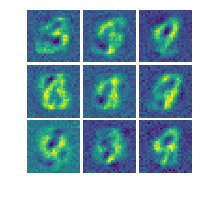

2018-05-17 22:29:36 iteration 8400/50000: current training loss = 7.149964 (=1.123563+0.463203+5.563198)


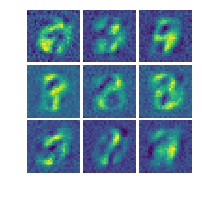

2018-05-17 22:29:46 iteration 8500/50000: current training loss = 11.450185 (=0.676726+0.313032+10.460426)


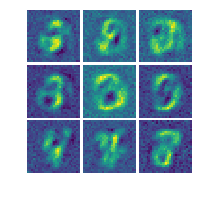

2018-05-17 22:29:55 iteration 8600/50000: current training loss = 9.749655 (=1.013934+0.372992+8.362729)


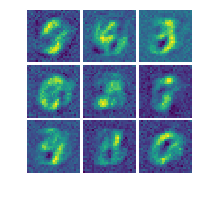

2018-05-17 22:30:05 iteration 8700/50000: current training loss = 40.487286 (=0.853326+0.383215+39.250744)


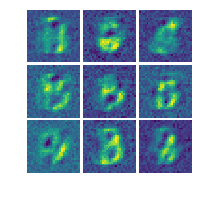

2018-05-17 22:30:15 iteration 8800/50000: current training loss = 27.733234 (=1.106430+0.426790+26.200014)


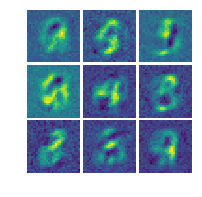

2018-05-17 22:30:24 iteration 8900/50000: current training loss = 35.319988 (=1.522451+0.578757+33.218781)


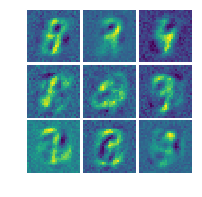

2018-05-17 22:30:34 iteration 9000/50000: current training loss = 47.915718 (=0.745461+0.364518+46.805740)


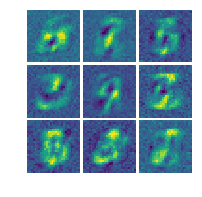

2018-05-17 22:30:44 iteration 9100/50000: current training loss = 36.579441 (=0.655581+0.309809+35.614052)


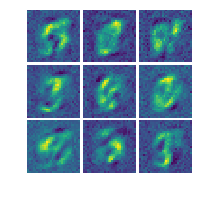

2018-05-17 22:30:54 iteration 9200/50000: current training loss = 33.073238 (=0.680398+0.333003+32.059837)


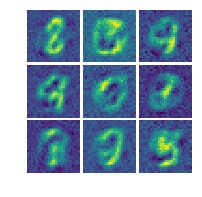

2018-05-17 22:31:04 iteration 9300/50000: current training loss = 58.189327 (=0.933074+0.413526+56.842728)


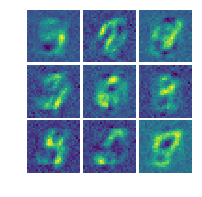

2018-05-17 22:31:13 iteration 9400/50000: current training loss = 33.238766 (=1.284123+0.394668+31.559973)


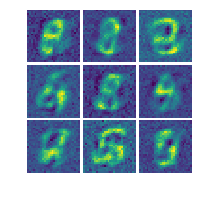

2018-05-17 22:31:23 iteration 9500/50000: current training loss = 24.346889 (=0.707149+0.338847+23.300894)


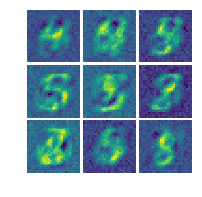

2018-05-17 22:31:33 iteration 9600/50000: current training loss = 18.925148 (=1.270829+0.427217+17.227102)


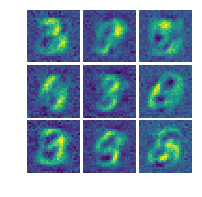

2018-05-17 22:31:42 iteration 9700/50000: current training loss = 13.010128 (=0.729568+0.328493+11.952067)


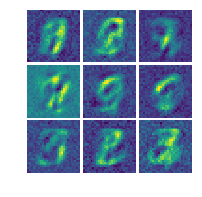

2018-05-17 22:31:52 iteration 9800/50000: current training loss = 14.305264 (=1.000920+0.332893+12.971450)


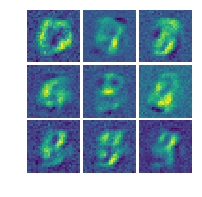

2018-05-17 22:32:02 iteration 9900/50000: current training loss = 25.087255 (=0.890619+0.384820+23.811815)


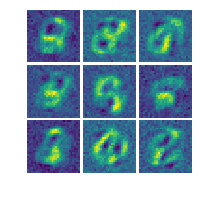

2018-05-17 22:32:11 iteration 10000/50000: current training loss = 11.954863 (=0.958350+0.362873+10.633639)


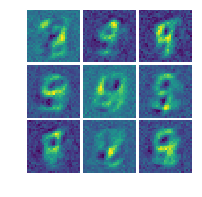

2018-05-17 22:32:21 iteration 10100/50000: current training loss = 10.901505 (=1.023460+0.457791+9.420254)


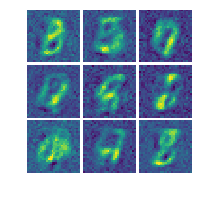

2018-05-17 22:32:31 iteration 10200/50000: current training loss = 11.388083 (=0.961865+0.320781+10.105437)


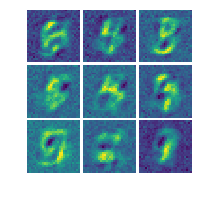

2018-05-17 22:32:41 iteration 10300/50000: current training loss = 9.033253 (=1.089167+0.410349+7.533737)


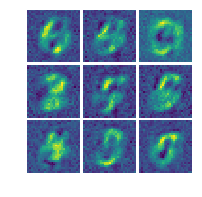

2018-05-17 22:32:50 iteration 10400/50000: current training loss = 12.255298 (=0.747541+0.349328+11.158429)


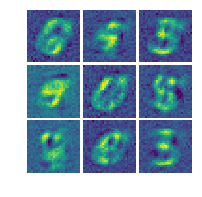

2018-05-17 22:33:00 iteration 10500/50000: current training loss = 10.736954 (=0.907015+0.332691+9.497248)


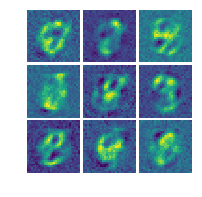

2018-05-17 22:33:10 iteration 10600/50000: current training loss = 7.851096 (=1.346552+0.488893+6.015652)


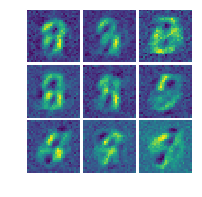

2018-05-17 22:33:20 iteration 10700/50000: current training loss = 13.095976 (=1.387482+0.468041+11.240453)


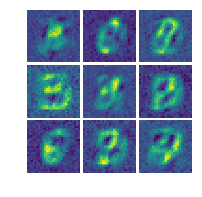

2018-05-17 22:33:29 iteration 10800/50000: current training loss = 8.346209 (=1.100694+0.289814+6.955700)


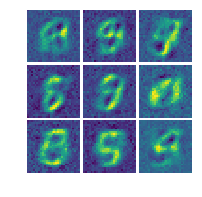

2018-05-17 22:33:39 iteration 10900/50000: current training loss = 13.151906 (=1.009293+0.326383+11.816230)


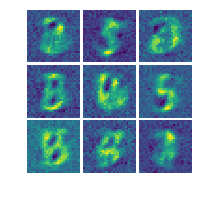

2018-05-17 22:33:49 iteration 11000/50000: current training loss = 12.293058 (=0.975250+0.424467+10.893341)


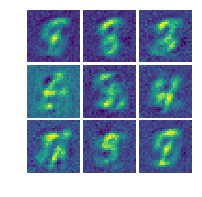

2018-05-17 22:33:58 iteration 11100/50000: current training loss = 7.423738 (=1.494530+0.436823+5.492385)


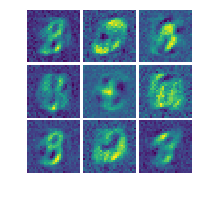

2018-05-17 22:34:08 iteration 11200/50000: current training loss = 7.747514 (=1.229995+0.344799+6.172720)


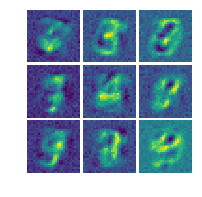

2018-05-17 22:34:16 iteration 11300/50000: current training loss = 16.056847 (=0.868091+0.428463+14.760293)


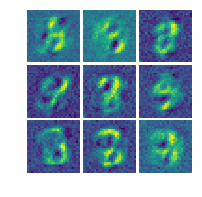

2018-05-17 22:34:25 iteration 11400/50000: current training loss = 16.192327 (=0.894801+0.334953+14.962573)


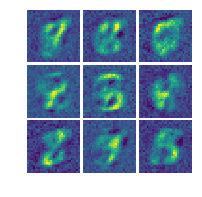

2018-05-17 22:34:35 iteration 11500/50000: current training loss = 14.145855 (=0.822846+0.345333+12.977675)


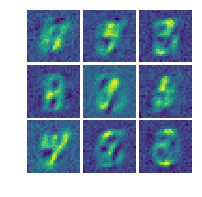

2018-05-17 22:34:44 iteration 11600/50000: current training loss = 10.402794 (=1.083684+0.351685+8.967425)


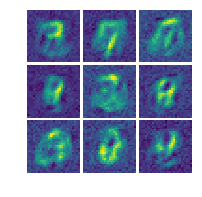

2018-05-17 22:34:54 iteration 11700/50000: current training loss = 11.526804 (=1.422865+0.389872+9.714067)


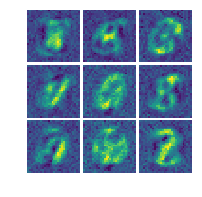

2018-05-17 22:35:03 iteration 11800/50000: current training loss = 7.386303 (=0.988597+0.393099+6.004607)


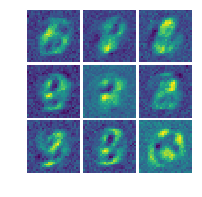

2018-05-17 22:35:13 iteration 11900/50000: current training loss = 20.787668 (=0.624115+0.355571+19.807981)


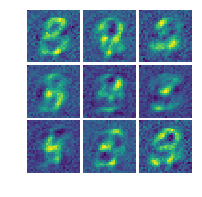

2018-05-17 22:35:23 iteration 12000/50000: current training loss = 5.955928 (=1.420968+0.612602+3.922359)


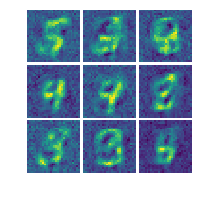

2018-05-17 22:35:33 iteration 12100/50000: current training loss = 8.336736 (=0.986372+0.402619+6.947746)


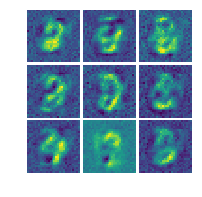

2018-05-17 22:35:43 iteration 12200/50000: current training loss = 9.202422 (=0.902484+0.313033+7.986906)


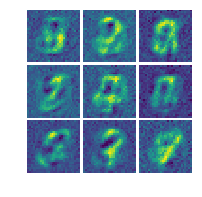

2018-05-17 22:35:53 iteration 12300/50000: current training loss = 7.286673 (=1.199672+0.447931+5.639071)


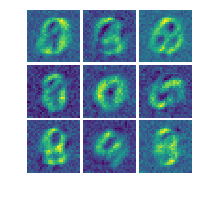

2018-05-17 22:36:03 iteration 12400/50000: current training loss = 14.112653 (=0.948676+0.357359+12.806618)


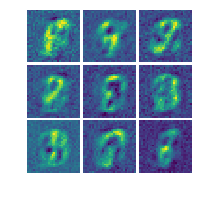

2018-05-17 22:36:12 iteration 12500/50000: current training loss = 6.776098 (=1.172138+0.450445+5.153515)


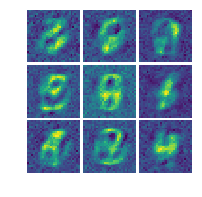

2018-05-17 22:36:22 iteration 12600/50000: current training loss = 6.128613 (=1.075720+0.472693+4.580200)


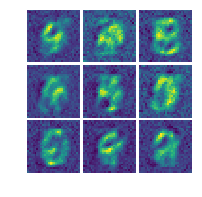

2018-05-17 22:36:32 iteration 12700/50000: current training loss = 7.392194 (=0.977260+0.437963+5.976971)


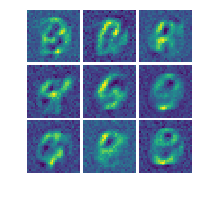

2018-05-17 22:36:41 iteration 12800/50000: current training loss = 20.070053 (=0.686777+0.372451+19.010824)


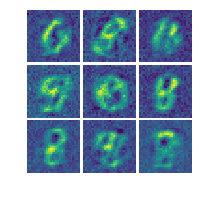

2018-05-17 22:36:51 iteration 12900/50000: current training loss = 21.488777 (=1.297250+0.373474+19.818054)


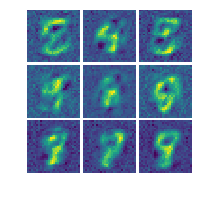

2018-05-17 22:37:01 iteration 13000/50000: current training loss = 23.022448 (=0.645866+0.372655+22.003927)


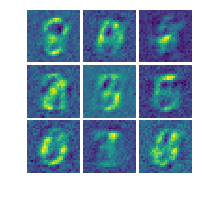

2018-05-17 22:37:10 iteration 13100/50000: current training loss = 18.221155 (=0.986646+0.357327+16.877182)


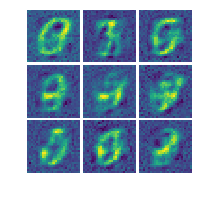

2018-05-17 22:37:20 iteration 13200/50000: current training loss = 9.525914 (=0.618306+0.338021+8.569588)


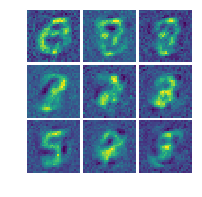

2018-05-17 22:37:30 iteration 13300/50000: current training loss = 11.695348 (=0.909346+0.353028+10.432974)


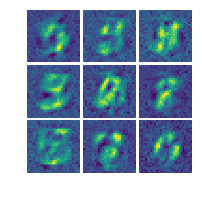

2018-05-17 22:37:40 iteration 13400/50000: current training loss = 11.559669 (=1.138037+0.403293+10.018338)


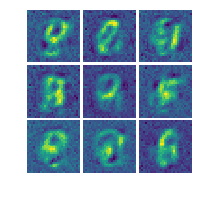

2018-05-17 22:37:50 iteration 13500/50000: current training loss = 15.248643 (=0.811959+0.310792+14.125892)


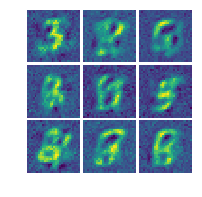

2018-05-17 22:37:59 iteration 13600/50000: current training loss = 9.397335 (=0.946939+0.366049+8.084347)


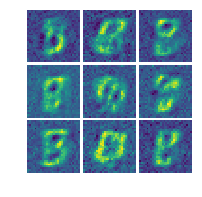

2018-05-17 22:38:09 iteration 13700/50000: current training loss = 9.323551 (=0.562808+0.340519+8.420224)


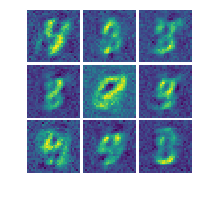

2018-05-17 22:38:18 iteration 13800/50000: current training loss = 11.128014 (=1.083381+0.362113+9.682519)


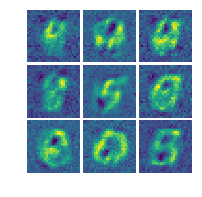

2018-05-17 22:38:28 iteration 13900/50000: current training loss = 10.582813 (=1.093426+0.419418+9.069969)


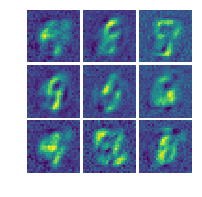

2018-05-17 22:38:38 iteration 14000/50000: current training loss = 20.457352 (=1.163288+0.353631+18.940432)


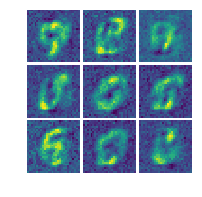

2018-05-17 22:38:47 iteration 14100/50000: current training loss = 8.858733 (=0.803744+0.323795+7.731194)


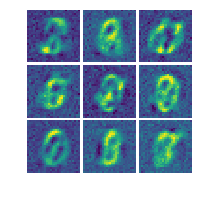

2018-05-17 22:38:57 iteration 14200/50000: current training loss = 10.746033 (=0.924511+0.412823+9.408698)


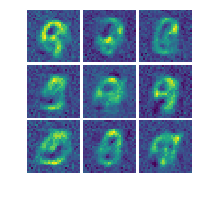

2018-05-17 22:39:07 iteration 14300/50000: current training loss = 11.881329 (=0.980209+0.616377+10.284743)


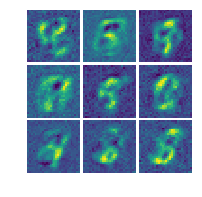

2018-05-17 22:39:17 iteration 14400/50000: current training loss = 11.997984 (=0.895096+0.330572+10.772316)


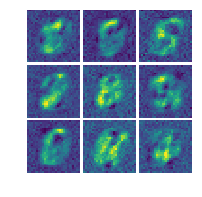

2018-05-17 22:39:26 iteration 14500/50000: current training loss = 8.081188 (=1.065336+0.425637+6.590216)


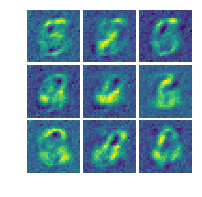

2018-05-17 22:39:36 iteration 14600/50000: current training loss = 27.191185 (=0.774325+0.332190+26.084669)


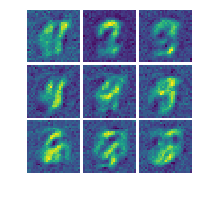

2018-05-17 22:39:46 iteration 14700/50000: current training loss = 20.140091 (=0.785154+0.433648+18.921289)


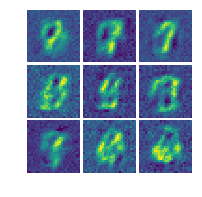

2018-05-17 22:39:56 iteration 14800/50000: current training loss = 26.921633 (=0.789285+0.338477+25.793871)


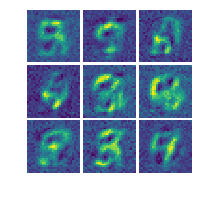

2018-05-17 22:40:06 iteration 14900/50000: current training loss = 9.149336 (=0.750413+0.354101+8.044822)


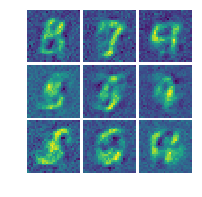

2018-05-17 22:40:15 iteration 15000/50000: current training loss = 21.749918 (=1.083852+0.404693+20.261374)


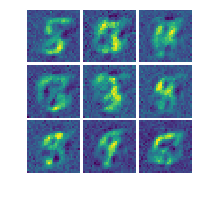

2018-05-17 22:40:25 iteration 15100/50000: current training loss = 9.479092 (=1.036469+0.431719+8.010903)


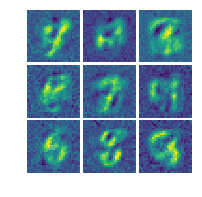

2018-05-17 22:40:34 iteration 15200/50000: current training loss = 20.926725 (=0.952384+0.409759+19.564583)


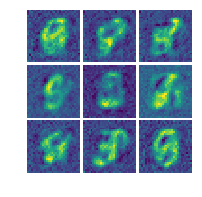

2018-05-17 22:40:44 iteration 15300/50000: current training loss = 12.432316 (=1.092987+0.346633+10.992696)


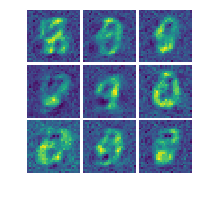

2018-05-17 22:40:53 iteration 15400/50000: current training loss = 16.790518 (=0.672513+0.327157+15.790848)


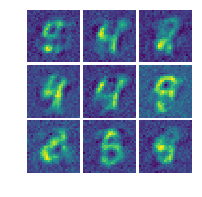

2018-05-17 22:41:03 iteration 15500/50000: current training loss = 13.059326 (=1.006941+0.385656+11.666730)


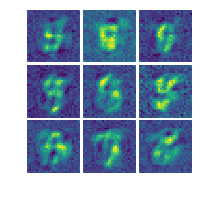

2018-05-17 22:41:13 iteration 15600/50000: current training loss = 18.197292 (=0.767347+0.334964+17.094982)


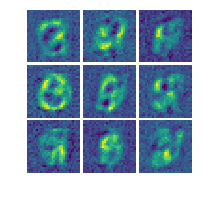

2018-05-17 22:41:23 iteration 15700/50000: current training loss = 11.912502 (=0.866863+0.335884+10.709755)


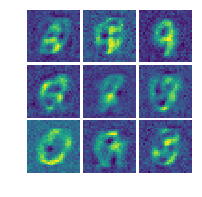

2018-05-17 22:41:33 iteration 15800/50000: current training loss = 12.023710 (=1.086146+0.407998+10.529567)


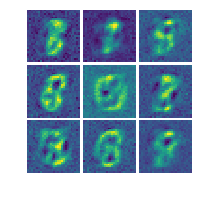

2018-05-17 22:41:44 iteration 15900/50000: current training loss = 11.163368 (=1.101102+0.400681+9.661586)


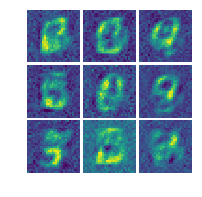

2018-05-17 22:41:54 iteration 16000/50000: current training loss = 12.621891 (=0.802269+0.315981+11.503642)


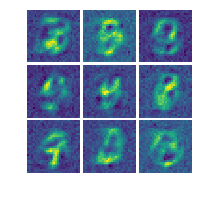

2018-05-17 22:42:05 iteration 16100/50000: current training loss = 21.320217 (=1.139760+0.316808+19.863649)


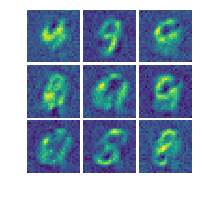

2018-05-17 22:42:15 iteration 16200/50000: current training loss = 16.820480 (=1.129686+0.426825+15.263969)


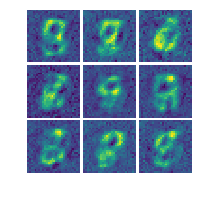

2018-05-17 22:42:24 iteration 16300/50000: current training loss = 9.698213 (=0.607519+0.329733+8.760961)


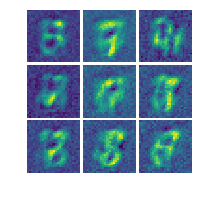

2018-05-17 22:42:35 iteration 16400/50000: current training loss = 13.440464 (=0.947065+0.467775+12.025624)


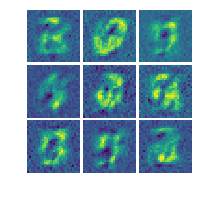

2018-05-17 22:42:45 iteration 16500/50000: current training loss = 9.972883 (=0.577802+0.301495+9.093587)


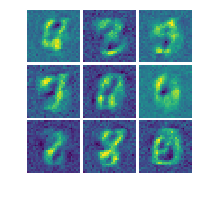

2018-05-17 22:42:55 iteration 16600/50000: current training loss = 21.335970 (=0.690656+0.349576+20.295738)


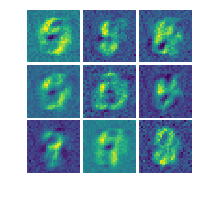

2018-05-17 22:43:05 iteration 16700/50000: current training loss = 21.521343 (=0.751301+0.316521+20.453522)


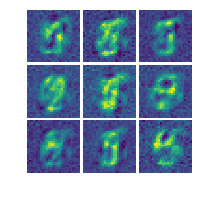

2018-05-17 22:43:15 iteration 16800/50000: current training loss = 18.102600 (=1.046794+0.388718+16.667088)


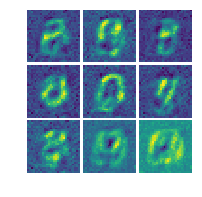

2018-05-17 22:43:25 iteration 16900/50000: current training loss = 11.664245 (=0.956631+0.361953+10.345660)


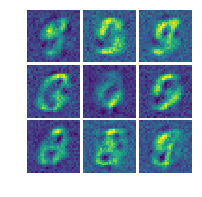

2018-05-17 22:43:35 iteration 17000/50000: current training loss = 18.436176 (=0.816468+0.412381+17.207329)


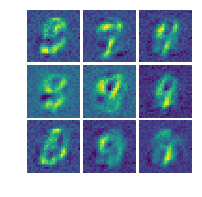

2018-05-17 22:43:44 iteration 17100/50000: current training loss = 13.247536 (=0.529675+0.328029+12.389832)


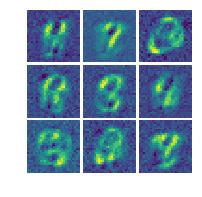

2018-05-17 22:43:54 iteration 17200/50000: current training loss = 10.927947 (=0.728060+0.331919+9.867969)


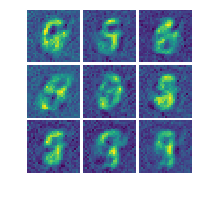

2018-05-17 22:44:04 iteration 17300/50000: current training loss = 27.220383 (=0.740452+0.366380+26.113550)


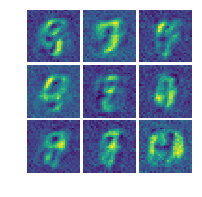

2018-05-17 22:44:13 iteration 17400/50000: current training loss = 12.417480 (=0.757813+0.338891+11.320775)


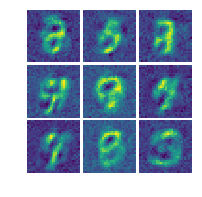

2018-05-17 22:44:23 iteration 17500/50000: current training loss = 16.168903 (=0.761756+0.322252+15.084895)


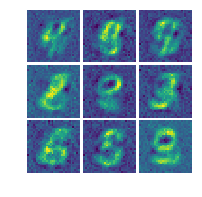

2018-05-17 22:44:33 iteration 17600/50000: current training loss = 19.105820 (=0.874763+0.324496+17.906561)


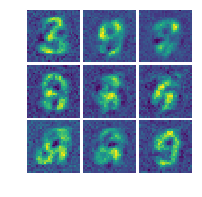

2018-05-17 22:44:43 iteration 17700/50000: current training loss = 27.617472 (=1.081419+0.316206+26.219847)


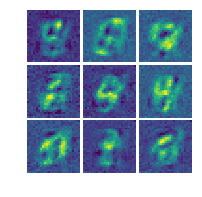

2018-05-17 22:44:53 iteration 17800/50000: current training loss = 11.892157 (=0.885318+0.323985+10.682854)


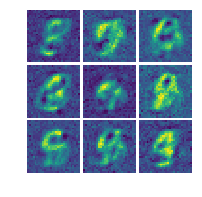

2018-05-17 22:45:03 iteration 17900/50000: current training loss = 24.014620 (=0.682488+0.351813+22.980318)


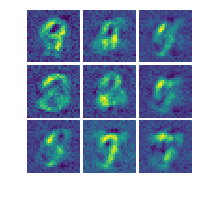

2018-05-17 22:45:12 iteration 18000/50000: current training loss = 11.542490 (=0.566381+0.363080+10.613029)


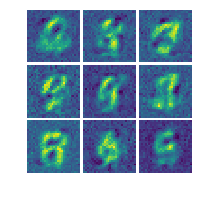

2018-05-17 22:45:22 iteration 18100/50000: current training loss = 22.499249 (=1.017831+0.368504+21.112913)


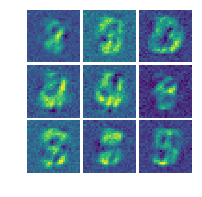

2018-05-17 22:45:32 iteration 18200/50000: current training loss = 13.797713 (=0.867634+0.356438+12.573642)


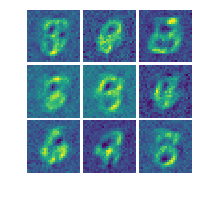

2018-05-17 22:45:42 iteration 18300/50000: current training loss = 9.458416 (=0.863090+0.435862+8.159464)


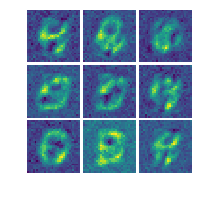

2018-05-17 22:45:51 iteration 18400/50000: current training loss = 27.909395 (=0.967920+0.384682+26.556793)


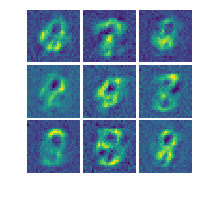

2018-05-17 22:46:02 iteration 18500/50000: current training loss = 14.205060 (=0.689073+0.330512+13.185475)


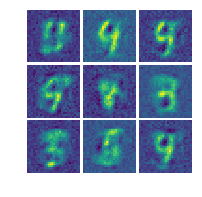

2018-05-17 22:46:12 iteration 18600/50000: current training loss = 13.885419 (=0.892011+0.353749+12.639659)


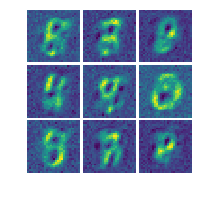

2018-05-17 22:46:22 iteration 18700/50000: current training loss = 11.683158 (=1.119016+0.433030+10.131112)


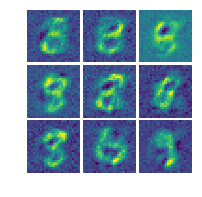

2018-05-17 22:46:31 iteration 18800/50000: current training loss = 10.882699 (=0.963997+0.382015+9.536687)


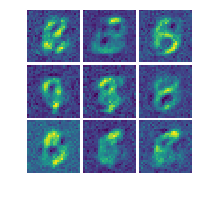

2018-05-17 22:46:41 iteration 18900/50000: current training loss = 15.846777 (=0.845263+0.345275+14.656239)


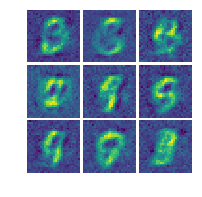

2018-05-17 22:46:50 iteration 19000/50000: current training loss = 17.276167 (=0.970567+0.376486+15.929112)


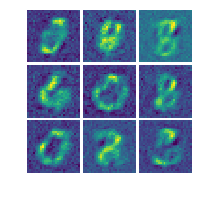

2018-05-17 22:47:00 iteration 19100/50000: current training loss = 14.137023 (=1.036983+0.348812+12.751227)


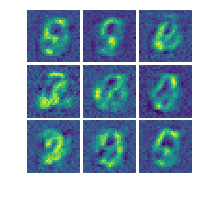

2018-05-17 22:47:10 iteration 19200/50000: current training loss = 17.669807 (=0.987632+0.374734+16.307442)


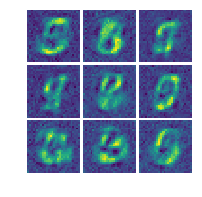

2018-05-17 22:47:20 iteration 19300/50000: current training loss = 17.527706 (=0.921937+0.327562+16.278208)


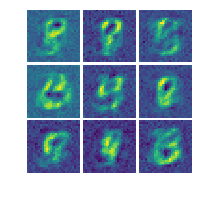

2018-05-17 22:47:30 iteration 19400/50000: current training loss = 14.246243 (=1.331038+0.323371+12.591834)


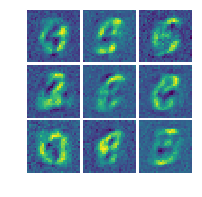

2018-05-17 22:47:39 iteration 19500/50000: current training loss = 19.294888 (=0.994371+0.375706+17.924810)


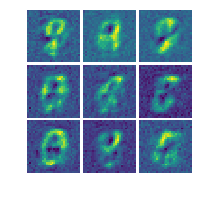

2018-05-17 22:47:49 iteration 19600/50000: current training loss = 28.368349 (=0.906714+0.291227+27.170408)


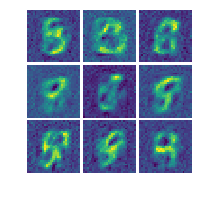

2018-05-17 22:47:59 iteration 19700/50000: current training loss = 12.559079 (=0.905851+0.378176+11.275052)


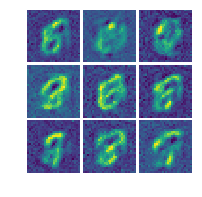

2018-05-17 22:48:09 iteration 19800/50000: current training loss = 30.321476 (=1.192345+0.317403+28.811728)


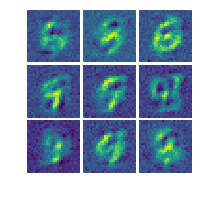

2018-05-17 22:48:18 iteration 19900/50000: current training loss = 23.043879 (=1.300230+0.426098+21.317551)


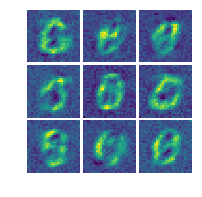

2018-05-17 22:48:28 iteration 20000/50000: current training loss = 11.856977 (=0.642011+0.321800+10.893167)


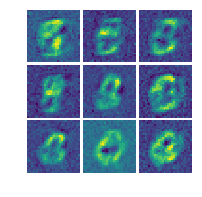

2018-05-17 22:48:38 iteration 20100/50000: current training loss = 32.372677 (=1.329040+0.384524+30.659113)


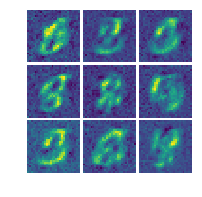

2018-05-17 22:48:47 iteration 20200/50000: current training loss = 19.121019 (=0.819674+0.329812+17.971533)


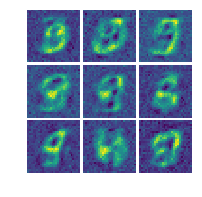

2018-05-17 22:48:57 iteration 20300/50000: current training loss = 17.057896 (=0.771884+0.295313+15.990699)


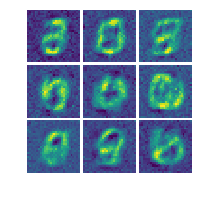

2018-05-17 22:49:07 iteration 20400/50000: current training loss = 13.111635 (=1.045032+0.389201+11.677402)


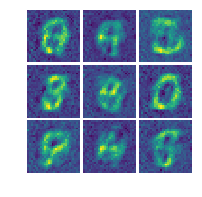

2018-05-17 22:49:17 iteration 20500/50000: current training loss = 28.669020 (=0.559975+0.328732+27.780313)


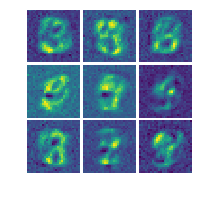

2018-05-17 22:49:27 iteration 20600/50000: current training loss = 18.301785 (=0.695998+0.336707+17.269079)


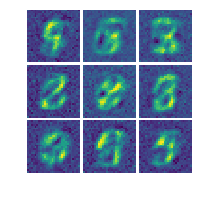

2018-05-17 22:49:37 iteration 20700/50000: current training loss = 19.497774 (=0.870330+0.437859+18.189587)


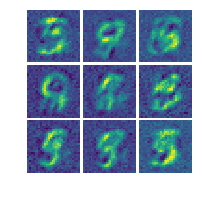

2018-05-17 22:49:47 iteration 20800/50000: current training loss = 16.077227 (=0.748898+0.331239+14.997090)


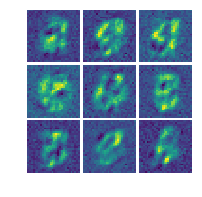

2018-05-17 22:49:56 iteration 20900/50000: current training loss = 17.271303 (=1.021113+0.328087+15.922103)


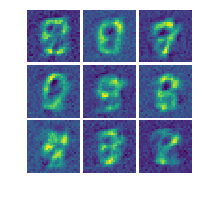

2018-05-17 22:50:06 iteration 21000/50000: current training loss = 26.971764 (=0.960455+0.305692+25.705618)


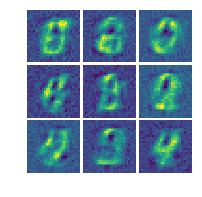

2018-05-17 22:50:16 iteration 21100/50000: current training loss = 11.659351 (=1.019328+0.300995+10.339028)


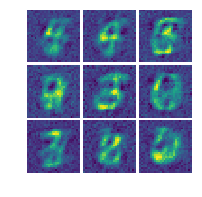

2018-05-17 22:50:26 iteration 21200/50000: current training loss = 10.256700 (=1.080947+0.346944+8.828809)


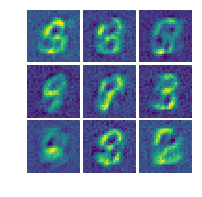

2018-05-17 22:50:35 iteration 21300/50000: current training loss = 21.261221 (=0.791491+0.321340+20.148390)


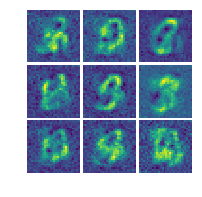

2018-05-17 22:50:45 iteration 21400/50000: current training loss = 11.557311 (=1.231044+0.372695+9.953572)


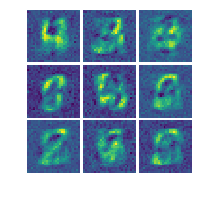

2018-05-17 22:50:55 iteration 21500/50000: current training loss = 16.194176 (=0.832709+0.313987+15.047481)


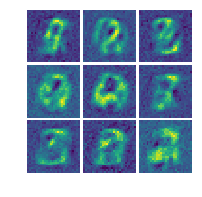

2018-05-17 22:51:05 iteration 21600/50000: current training loss = 13.756827 (=0.868802+0.361152+12.526874)


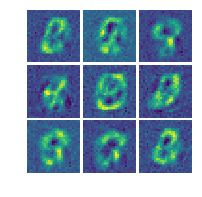

2018-05-17 22:51:14 iteration 21700/50000: current training loss = 24.243078 (=1.493857+0.349838+22.399384)


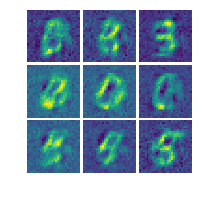

2018-05-17 22:51:24 iteration 21800/50000: current training loss = 21.325216 (=1.108133+0.359002+19.858082)


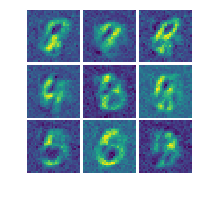

2018-05-17 22:51:33 iteration 21900/50000: current training loss = 22.209007 (=1.489596+0.348196+20.371214)


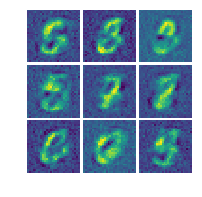

2018-05-17 22:51:43 iteration 22000/50000: current training loss = 67.920746 (=0.774040+0.338492+66.808212)


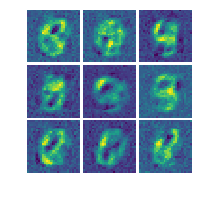

2018-05-17 22:51:53 iteration 22100/50000: current training loss = 38.711578 (=1.454804+0.537585+36.719189)


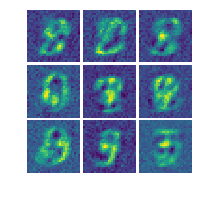

2018-05-17 22:52:03 iteration 22200/50000: current training loss = 27.248501 (=0.865661+0.368061+26.014778)


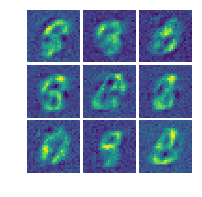

2018-05-17 22:52:13 iteration 22300/50000: current training loss = 70.628563 (=0.849245+0.382415+69.396904)


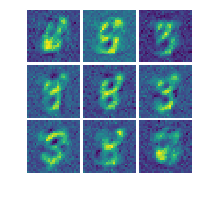

2018-05-17 22:52:23 iteration 22400/50000: current training loss = 66.205574 (=0.324299+0.406376+65.474899)


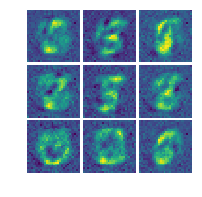

2018-05-17 22:52:33 iteration 22500/50000: current training loss = 22.135666 (=0.680459+0.382393+21.072813)


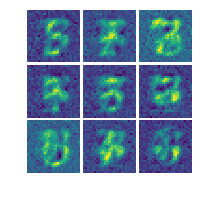

2018-05-17 22:52:42 iteration 22600/50000: current training loss = 38.186523 (=1.228773+0.396350+36.561401)


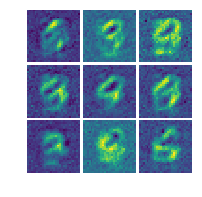

2018-05-17 22:52:52 iteration 22700/50000: current training loss = 28.852879 (=1.072853+0.343838+27.436188)


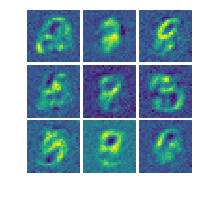

2018-05-17 22:53:02 iteration 22800/50000: current training loss = 27.067017 (=1.454534+0.357315+25.255167)


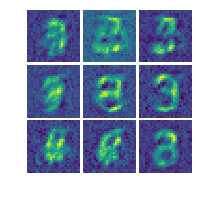

2018-05-17 22:53:12 iteration 22900/50000: current training loss = 16.958282 (=0.822613+0.335193+15.800475)


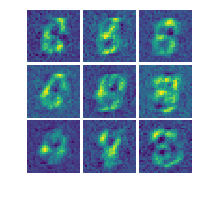

2018-05-17 22:53:21 iteration 23000/50000: current training loss = 13.751107 (=0.883602+0.386952+12.480553)


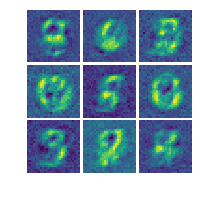

2018-05-17 22:53:31 iteration 23100/50000: current training loss = 18.468599 (=0.796956+0.341045+17.330599)


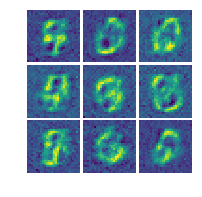

2018-05-17 22:53:41 iteration 23200/50000: current training loss = 13.835144 (=0.872986+0.334500+12.627659)


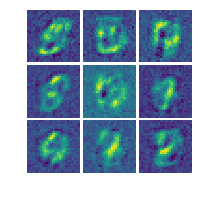

2018-05-17 22:53:50 iteration 23300/50000: current training loss = 16.358078 (=0.872414+0.332740+15.152924)


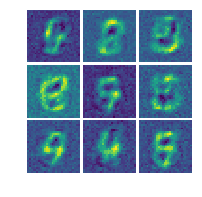

2018-05-17 22:54:00 iteration 23400/50000: current training loss = 12.126950 (=0.639830+0.335308+11.151813)


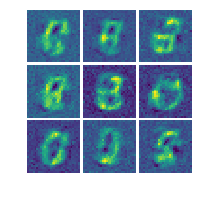

2018-05-17 22:54:10 iteration 23500/50000: current training loss = 15.485468 (=1.101093+0.312589+14.071786)


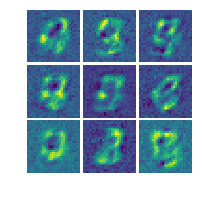

2018-05-17 22:54:20 iteration 23600/50000: current training loss = 8.628827 (=1.103464+0.377949+7.147414)


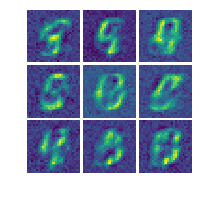

2018-05-17 22:54:29 iteration 23700/50000: current training loss = 8.459512 (=1.303512+0.351718+6.804282)


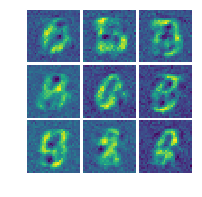

2018-05-17 22:54:39 iteration 23800/50000: current training loss = 10.890326 (=1.168203+0.336386+9.385736)


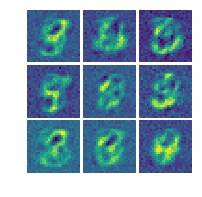

2018-05-17 22:54:49 iteration 23900/50000: current training loss = 15.494679 (=1.091746+0.337337+14.065597)


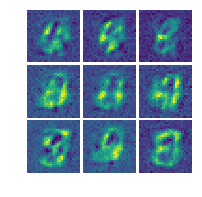

2018-05-17 22:54:58 iteration 24000/50000: current training loss = 16.162354 (=0.673382+0.318395+15.170577)


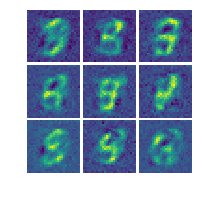

2018-05-17 22:55:08 iteration 24100/50000: current training loss = 8.137208 (=0.927640+0.330424+6.879144)


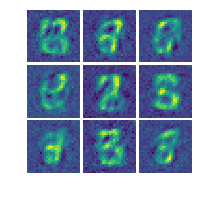

2018-05-17 22:55:17 iteration 24200/50000: current training loss = 12.653190 (=0.651207+0.304667+11.697316)


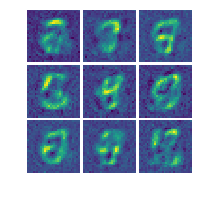

2018-05-17 22:55:27 iteration 24300/50000: current training loss = 19.200727 (=1.117861+0.411355+17.671511)


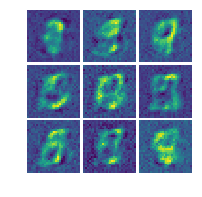

2018-05-17 22:55:37 iteration 24400/50000: current training loss = 14.639076 (=0.658936+0.363903+13.616237)


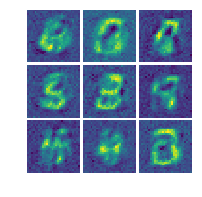

2018-05-17 22:55:46 iteration 24500/50000: current training loss = 29.634951 (=1.248688+0.353807+28.032455)


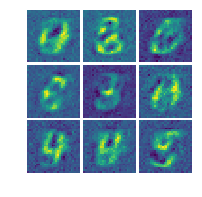

2018-05-17 22:55:55 iteration 24600/50000: current training loss = 20.107119 (=1.129127+0.357362+18.620630)


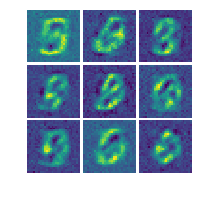

2018-05-17 22:56:05 iteration 24700/50000: current training loss = 52.216099 (=1.311181+0.319815+50.585102)


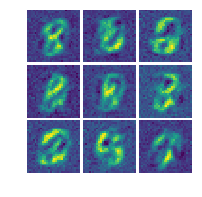

2018-05-17 22:56:15 iteration 24800/50000: current training loss = 28.249275 (=0.788359+0.323494+27.137421)


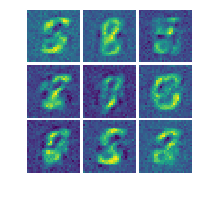

2018-05-17 22:56:24 iteration 24900/50000: current training loss = 29.379282 (=1.055798+0.302411+28.021072)


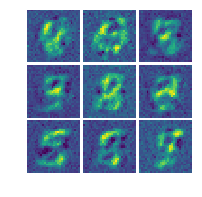

2018-05-17 22:56:34 iteration 25000/50000: current training loss = 24.803133 (=0.764472+0.324673+23.713987)


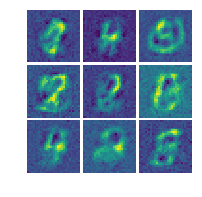

2018-05-17 22:56:44 iteration 25100/50000: current training loss = 15.403464 (=0.447366+0.316667+14.639432)


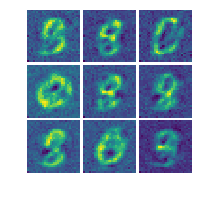

2018-05-17 22:56:53 iteration 25200/50000: current training loss = 25.713989 (=1.002323+0.418020+24.293648)


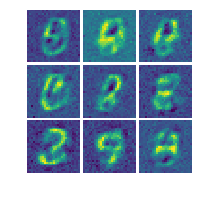

2018-05-17 22:57:03 iteration 25300/50000: current training loss = 21.466822 (=0.364014+0.279709+20.823099)


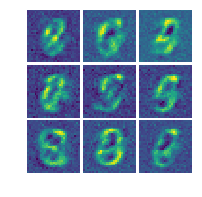

2018-05-17 22:57:12 iteration 25400/50000: current training loss = 19.990829 (=1.138742+0.320873+18.531214)


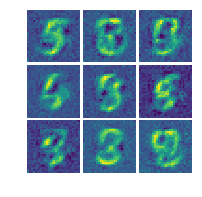

2018-05-17 22:57:22 iteration 25500/50000: current training loss = 32.558010 (=0.896764+0.348177+31.313070)


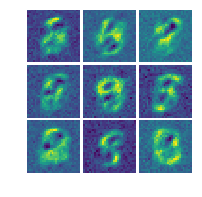

2018-05-17 22:57:32 iteration 25600/50000: current training loss = 22.656775 (=1.222111+0.304237+21.130426)


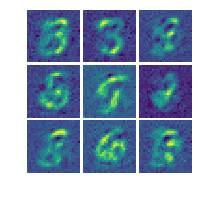

2018-05-17 22:57:41 iteration 25700/50000: current training loss = 32.040398 (=1.580477+0.380500+30.079422)


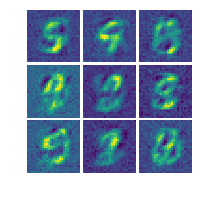

2018-05-17 22:57:51 iteration 25800/50000: current training loss = 16.804180 (=0.836735+0.267882+15.699563)


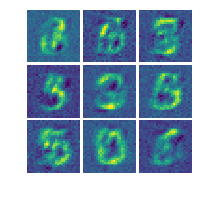

2018-05-17 22:58:00 iteration 25900/50000: current training loss = 18.276455 (=1.235797+0.304824+16.735834)


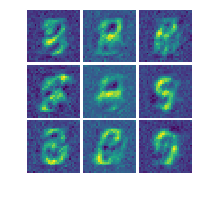

2018-05-17 22:58:10 iteration 26000/50000: current training loss = 14.851605 (=0.892893+0.404335+13.554378)


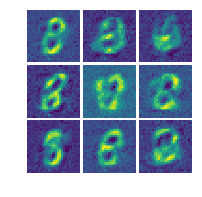

2018-05-17 22:58:19 iteration 26100/50000: current training loss = 15.658472 (=1.013287+0.284634+14.360551)


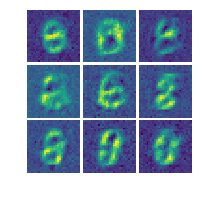

2018-05-17 22:58:29 iteration 26200/50000: current training loss = 13.655127 (=1.417413+0.323910+11.913803)


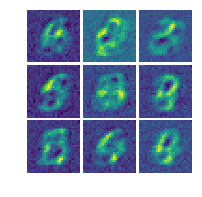

2018-05-17 22:58:38 iteration 26300/50000: current training loss = 22.617918 (=0.965203+0.301887+21.350828)


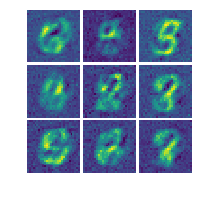

2018-05-17 22:58:48 iteration 26400/50000: current training loss = 22.544968 (=0.684984+0.318429+21.541555)


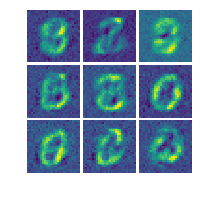

2018-05-17 22:58:58 iteration 26500/50000: current training loss = 10.849146 (=1.121300+0.257703+9.470142)


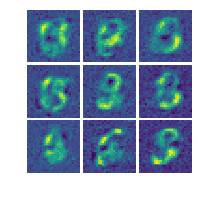

2018-05-17 22:59:08 iteration 26600/50000: current training loss = 39.124615 (=0.798715+0.266418+38.059483)


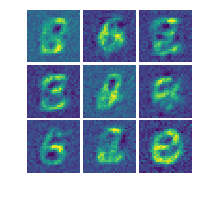

2018-05-17 22:59:17 iteration 26700/50000: current training loss = 16.360792 (=0.992415+0.316006+15.052371)


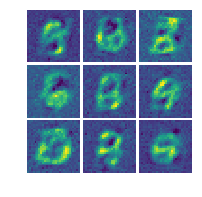

2018-05-17 22:59:27 iteration 26800/50000: current training loss = 43.637337 (=1.006663+0.323512+42.307163)


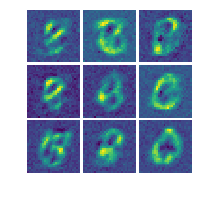

2018-05-17 22:59:37 iteration 26900/50000: current training loss = 10.603037 (=2.095310+0.855938+7.651788)


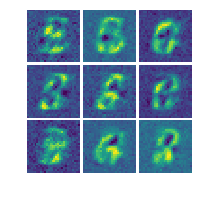

2018-05-17 22:59:47 iteration 27000/50000: current training loss = 23.255280 (=1.015091+0.280016+21.960173)


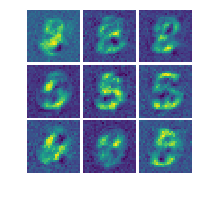

2018-05-17 22:59:56 iteration 27100/50000: current training loss = 12.077997 (=1.145042+0.317209+10.615746)


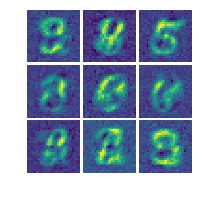

2018-05-17 23:00:06 iteration 27200/50000: current training loss = 37.440544 (=1.121343+0.316808+36.002392)


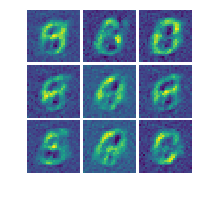

2018-05-17 23:00:16 iteration 27300/50000: current training loss = 36.048233 (=1.469444+0.322863+34.255924)


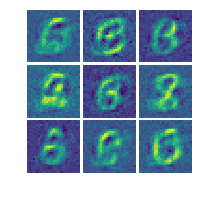

2018-05-17 23:00:25 iteration 27400/50000: current training loss = 31.253334 (=1.230430+0.381441+29.641462)


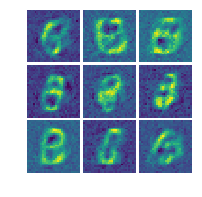

2018-05-17 23:00:35 iteration 27500/50000: current training loss = 28.503920 (=1.250792+0.421168+26.831961)


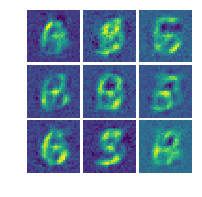

2018-05-17 23:00:45 iteration 27600/50000: current training loss = 31.472765 (=1.543770+0.296814+29.632181)


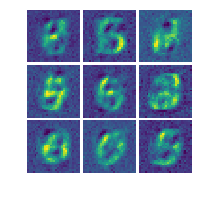

2018-05-17 23:00:54 iteration 27700/50000: current training loss = 9.936983 (=1.065047+0.332648+8.539288)


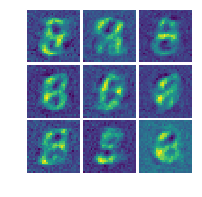

2018-05-17 23:01:04 iteration 27800/50000: current training loss = 11.201915 (=1.259916+0.355412+9.586587)


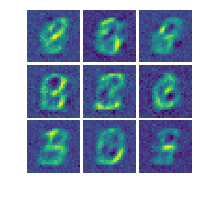

2018-05-17 23:01:14 iteration 27900/50000: current training loss = 15.150346 (=0.947401+0.310970+13.891975)


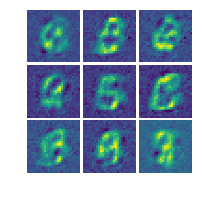

2018-05-17 23:01:24 iteration 28000/50000: current training loss = 9.823562 (=1.019640+0.297700+8.506222)


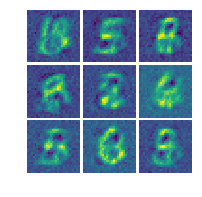

2018-05-17 23:01:33 iteration 28100/50000: current training loss = 29.191187 (=1.288230+0.310582+27.592375)


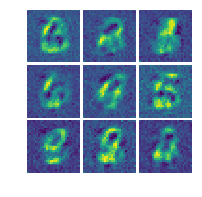

2018-05-17 23:01:43 iteration 28200/50000: current training loss = 21.715792 (=1.415565+0.325935+19.974291)


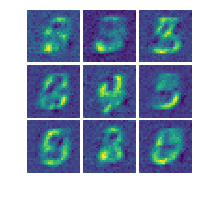

2018-05-17 23:01:52 iteration 28300/50000: current training loss = 17.999537 (=1.482825+0.320173+16.196539)


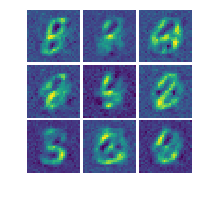

2018-05-17 23:02:01 iteration 28400/50000: current training loss = 12.029519 (=1.015908+0.306476+10.707135)


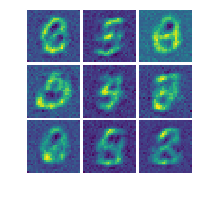

2018-05-17 23:02:11 iteration 28500/50000: current training loss = 10.060830 (=1.135269+0.312402+8.613158)


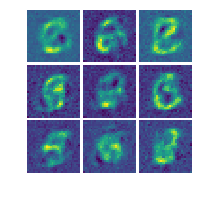

2018-05-17 23:02:20 iteration 28600/50000: current training loss = 8.747533 (=1.288839+0.305958+7.152736)


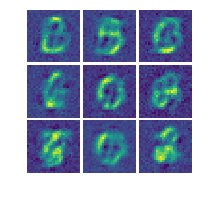

2018-05-17 23:02:30 iteration 28700/50000: current training loss = 10.933202 (=1.046481+0.297810+9.588910)


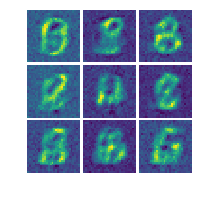

2018-05-17 23:02:39 iteration 28800/50000: current training loss = 11.090324 (=1.682953+0.335612+9.071760)


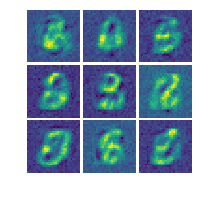

2018-05-17 23:02:49 iteration 28900/50000: current training loss = 17.740063 (=1.283337+0.315322+16.141403)


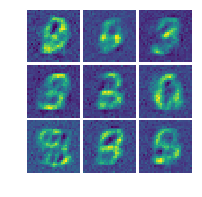

2018-05-17 23:02:58 iteration 29000/50000: current training loss = 12.025496 (=1.319619+0.306901+10.398976)


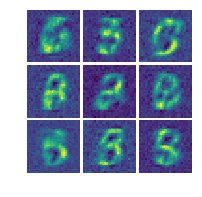

2018-05-17 23:03:08 iteration 29100/50000: current training loss = 10.639471 (=1.250999+0.366728+9.021744)


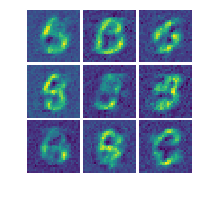

2018-05-17 23:03:17 iteration 29200/50000: current training loss = 20.952044 (=1.768822+0.352688+18.830534)


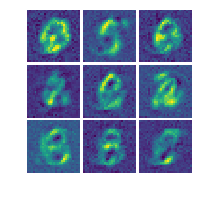

2018-05-17 23:03:27 iteration 29300/50000: current training loss = 12.285984 (=0.948502+0.276851+11.060632)


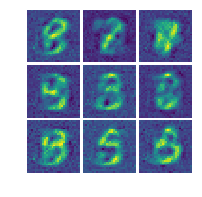

2018-05-17 23:03:37 iteration 29400/50000: current training loss = 21.689253 (=1.109961+0.348550+20.230742)


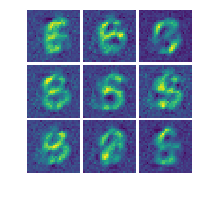

2018-05-17 23:03:47 iteration 29500/50000: current training loss = 27.540897 (=1.279368+0.350062+25.911469)


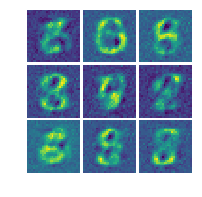

2018-05-17 23:03:56 iteration 29600/50000: current training loss = 17.916842 (=0.993135+0.328753+16.594954)


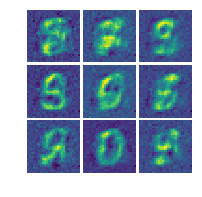

2018-05-17 23:04:06 iteration 29700/50000: current training loss = 20.029470 (=1.944615+0.357324+17.727531)


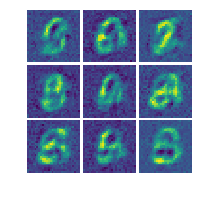

2018-05-17 23:04:15 iteration 29800/50000: current training loss = 39.149460 (=1.689074+0.354591+37.105797)


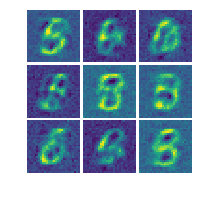

2018-05-17 23:04:25 iteration 29900/50000: current training loss = 44.876923 (=1.141926+0.309537+43.425461)


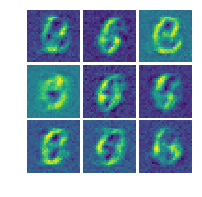

2018-05-17 23:04:35 iteration 30000/50000: current training loss = 38.853733 (=1.340988+0.310306+37.202438)


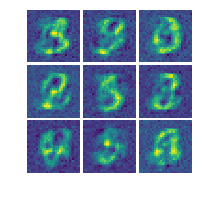

2018-05-17 23:04:45 iteration 30100/50000: current training loss = 21.917400 (=1.251345+0.312133+20.353922)


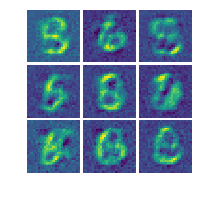

2018-05-17 23:04:55 iteration 30200/50000: current training loss = 14.967397 (=1.261438+0.339155+13.366803)


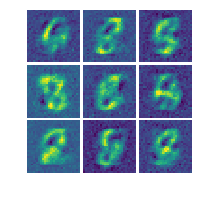

2018-05-17 23:05:05 iteration 30300/50000: current training loss = 34.519371 (=1.604560+0.386045+32.528767)


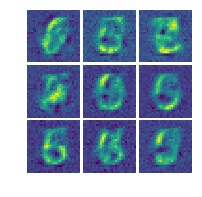

2018-05-17 23:05:15 iteration 30400/50000: current training loss = 14.681532 (=1.188289+0.389082+13.104161)


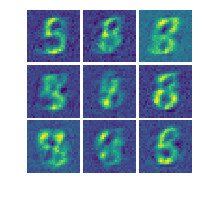

2018-05-17 23:05:25 iteration 30500/50000: current training loss = 28.519484 (=1.087054+0.309092+27.123337)


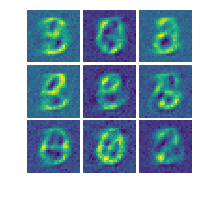

2018-05-17 23:05:35 iteration 30600/50000: current training loss = 37.353767 (=0.812902+0.347069+36.193798)


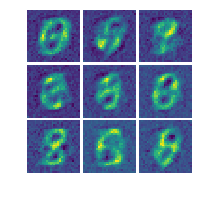

2018-05-17 23:05:45 iteration 30700/50000: current training loss = 28.685387 (=1.330190+0.288025+27.067171)


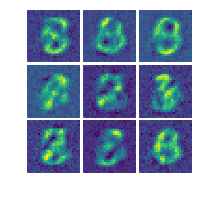

2018-05-17 23:05:55 iteration 30800/50000: current training loss = 20.054817 (=0.883410+0.351807+18.819601)


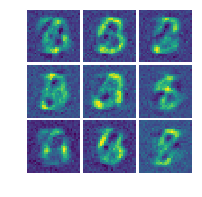

2018-05-17 23:06:04 iteration 30900/50000: current training loss = 29.200167 (=0.874469+0.309724+28.015974)


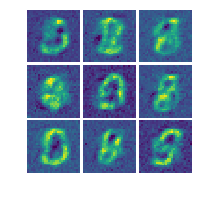

2018-05-17 23:06:14 iteration 31000/50000: current training loss = 38.027550 (=0.643237+0.323191+37.061123)


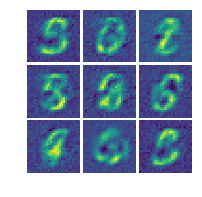

2018-05-17 23:06:24 iteration 31100/50000: current training loss = 21.726128 (=1.275548+0.336465+20.114115)


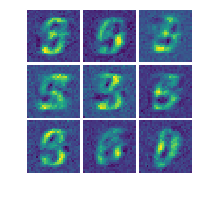

2018-05-17 23:06:34 iteration 31200/50000: current training loss = 24.039589 (=0.819281+0.326746+22.893562)


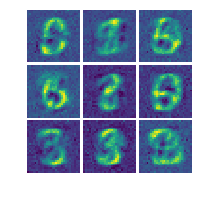

2018-05-17 23:06:44 iteration 31300/50000: current training loss = 30.513783 (=1.034697+0.296996+29.182089)


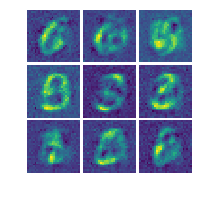

2018-05-17 23:06:54 iteration 31400/50000: current training loss = 12.265015 (=1.349887+0.346859+10.568268)


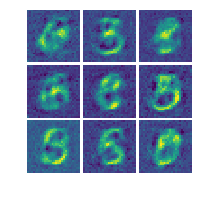

2018-05-17 23:07:04 iteration 31500/50000: current training loss = 31.246288 (=1.168631+0.299909+29.777748)


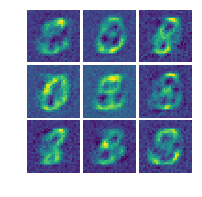

2018-05-17 23:07:14 iteration 31600/50000: current training loss = 29.076847 (=1.159910+0.270101+27.646835)


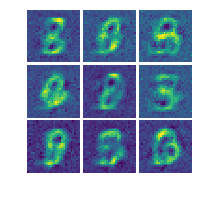

2018-05-17 23:07:24 iteration 31700/50000: current training loss = 26.869202 (=0.575092+0.328649+25.965460)


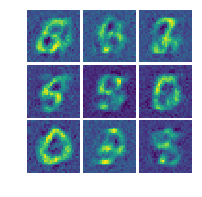

2018-05-17 23:07:34 iteration 31800/50000: current training loss = 28.124374 (=1.461859+0.379356+26.283159)


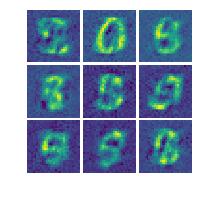

2018-05-17 23:07:44 iteration 31900/50000: current training loss = 18.594856 (=0.959133+0.351826+17.283897)


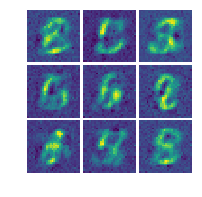

2018-05-17 23:07:54 iteration 32000/50000: current training loss = 20.990232 (=0.921640+0.352580+19.716013)


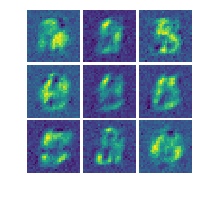

2018-05-17 23:08:03 iteration 32100/50000: current training loss = 62.178307 (=0.931584+0.349493+60.897228)


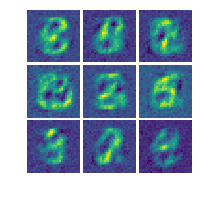

2018-05-17 23:08:13 iteration 32200/50000: current training loss = 16.520430 (=0.855061+0.324030+15.341338)


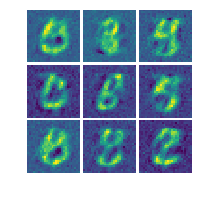

2018-05-17 23:08:23 iteration 32300/50000: current training loss = 19.060457 (=1.672101+0.382954+17.005404)


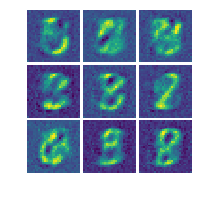

2018-05-17 23:08:33 iteration 32400/50000: current training loss = 27.580208 (=0.890196+0.306339+26.383673)


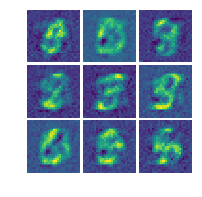

2018-05-17 23:08:43 iteration 32500/50000: current training loss = 20.037071 (=0.887109+0.335852+18.814110)


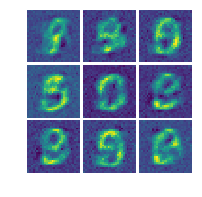

2018-05-17 23:08:52 iteration 32600/50000: current training loss = 22.575003 (=0.737334+0.300383+21.537287)


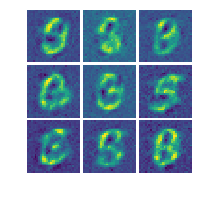

2018-05-17 23:09:02 iteration 32700/50000: current training loss = 28.601217 (=0.649306+0.283470+27.668442)


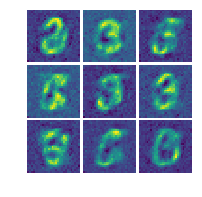

2018-05-17 23:09:12 iteration 32800/50000: current training loss = 14.475309 (=1.717415+0.371285+12.386609)


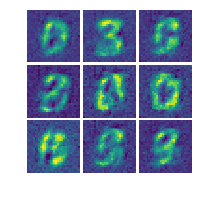

2018-05-17 23:09:22 iteration 32900/50000: current training loss = 28.930517 (=1.135606+0.310536+27.484375)


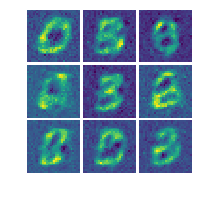

2018-05-17 23:09:31 iteration 33000/50000: current training loss = 38.850510 (=1.900955+0.384984+36.564571)


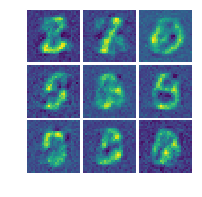

2018-05-17 23:09:41 iteration 33100/50000: current training loss = 29.539009 (=1.085868+0.308742+28.144400)


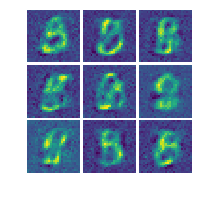

2018-05-17 23:09:51 iteration 33200/50000: current training loss = 17.629848 (=1.457211+0.322898+15.849739)


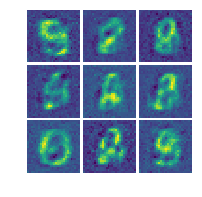

2018-05-17 23:10:00 iteration 33300/50000: current training loss = 75.203064 (=0.981279+0.341120+73.880669)


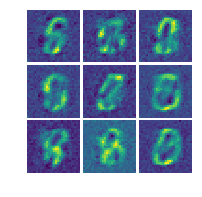

2018-05-17 23:10:10 iteration 33400/50000: current training loss = 30.097994 (=1.492189+0.290572+28.315233)


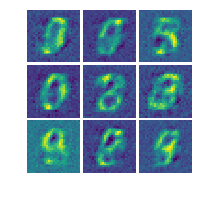

2018-05-17 23:10:19 iteration 33500/50000: current training loss = 15.670302 (=1.216265+0.300072+14.153965)


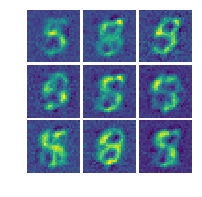

2018-05-17 23:10:29 iteration 33600/50000: current training loss = 15.963581 (=1.155609+0.298646+14.509326)


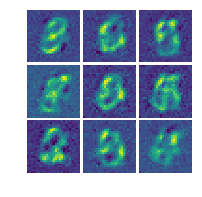

2018-05-17 23:10:38 iteration 33700/50000: current training loss = 21.629616 (=1.124629+0.354933+20.150055)


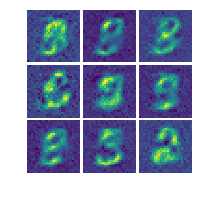

2018-05-17 23:10:48 iteration 33800/50000: current training loss = 14.718251 (=1.796363+0.315331+12.606557)


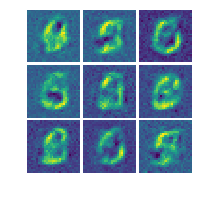

2018-05-17 23:10:58 iteration 33900/50000: current training loss = 24.598377 (=1.600959+0.320118+22.677301)


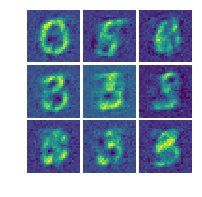

2018-05-17 23:11:07 iteration 34000/50000: current training loss = 28.379690 (=1.166099+0.323792+26.889799)


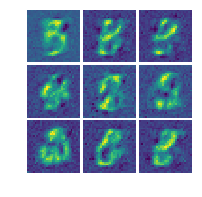

2018-05-17 23:11:17 iteration 34100/50000: current training loss = 31.357782 (=1.416800+0.301119+29.639862)


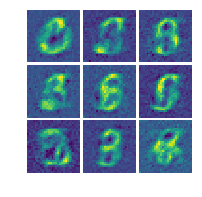

2018-05-17 23:11:26 iteration 34200/50000: current training loss = 28.094805 (=1.082557+0.283295+26.728952)


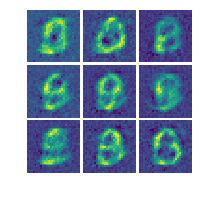

2018-05-17 23:11:36 iteration 34300/50000: current training loss = 39.770424 (=0.930594+0.324012+38.515816)


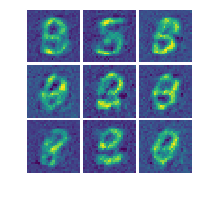

2018-05-17 23:11:46 iteration 34400/50000: current training loss = 26.573984 (=1.070595+0.287497+25.215891)


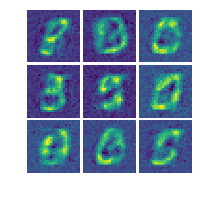

2018-05-17 23:11:55 iteration 34500/50000: current training loss = 20.196772 (=0.981177+0.300675+18.914919)


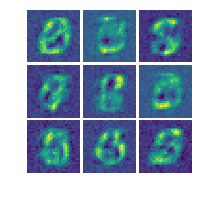

2018-05-17 23:12:05 iteration 34600/50000: current training loss = 15.934408 (=1.208151+0.339249+14.387008)


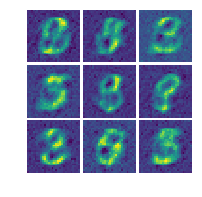

2018-05-17 23:12:14 iteration 34700/50000: current training loss = 23.796474 (=1.283257+0.276844+22.236374)


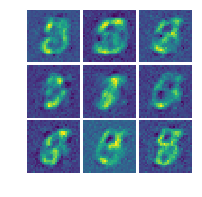

2018-05-17 23:12:24 iteration 34800/50000: current training loss = 35.825272 (=1.599356+0.341634+33.884281)


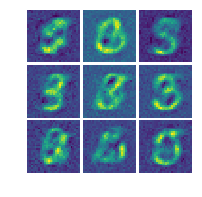

2018-05-17 23:12:34 iteration 34900/50000: current training loss = 19.625969 (=0.926904+0.289445+18.409620)


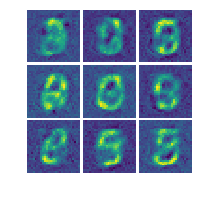

2018-05-17 23:12:43 iteration 35000/50000: current training loss = 13.768714 (=1.605079+0.308549+11.855086)


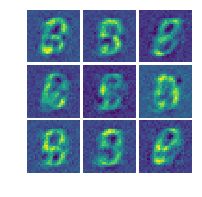

2018-05-17 23:12:53 iteration 35100/50000: current training loss = 39.136982 (=1.484214+0.319654+37.333115)


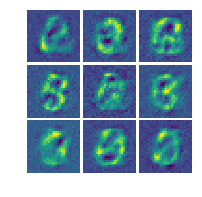

2018-05-17 23:13:03 iteration 35200/50000: current training loss = 15.219477 (=1.202926+0.316618+13.699932)


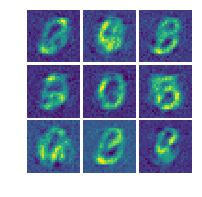

2018-05-17 23:13:13 iteration 35300/50000: current training loss = 29.903803 (=1.422188+0.318259+28.163355)


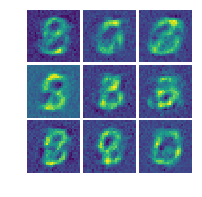

2018-05-17 23:13:23 iteration 35400/50000: current training loss = 18.883688 (=1.035131+0.320328+17.528229)


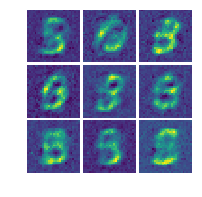

2018-05-17 23:13:33 iteration 35500/50000: current training loss = 47.716961 (=1.098306+0.291410+46.327244)


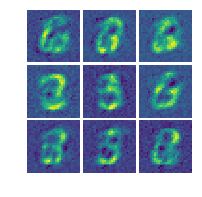

2018-05-17 23:13:43 iteration 35600/50000: current training loss = 46.383801 (=0.982430+0.305077+45.096294)


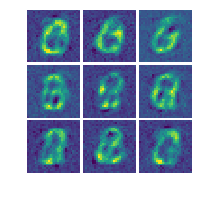

2018-05-17 23:13:52 iteration 35700/50000: current training loss = 45.947567 (=0.971481+0.300043+44.676041)


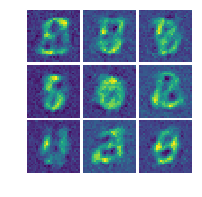

2018-05-17 23:14:02 iteration 35800/50000: current training loss = 34.585632 (=1.331081+0.286891+32.967659)


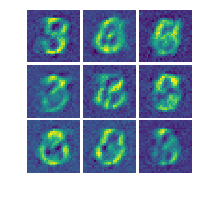

2018-05-17 23:14:12 iteration 35900/50000: current training loss = 38.036133 (=1.243304+0.321160+36.471668)


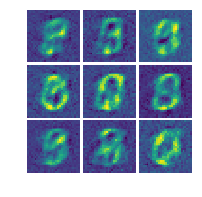

2018-05-17 23:14:21 iteration 36000/50000: current training loss = 25.090923 (=1.070714+0.303895+23.716314)


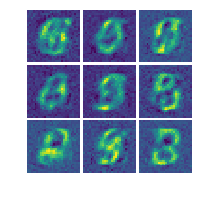

2018-05-17 23:14:31 iteration 36100/50000: current training loss = 23.617765 (=1.154974+0.346625+22.116165)


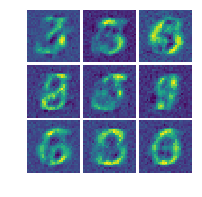

2018-05-17 23:14:41 iteration 36200/50000: current training loss = 27.437658 (=1.245593+0.276822+25.915243)


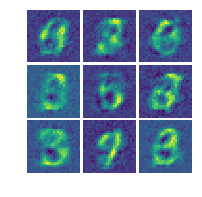

2018-05-17 23:14:50 iteration 36300/50000: current training loss = 22.617643 (=1.188347+0.285160+21.144136)


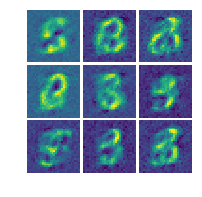

2018-05-17 23:15:00 iteration 36400/50000: current training loss = 42.681515 (=1.340643+0.386543+40.954330)


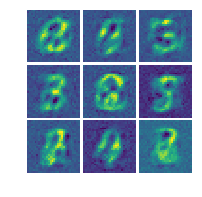

2018-05-17 23:15:10 iteration 36500/50000: current training loss = 37.373718 (=1.184426+0.346767+35.842525)


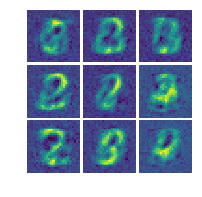

2018-05-17 23:15:19 iteration 36600/50000: current training loss = 50.398781 (=1.353081+0.307170+48.738529)


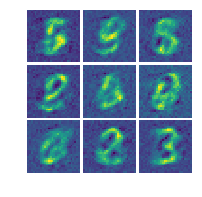

2018-05-17 23:15:29 iteration 36700/50000: current training loss = 28.044197 (=1.083007+0.291887+26.669302)


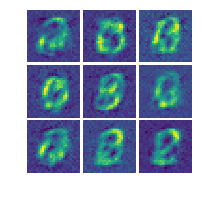

2018-05-17 23:15:39 iteration 36800/50000: current training loss = 73.844078 (=2.314617+0.649770+70.879692)


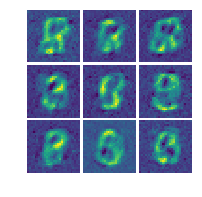

2018-05-17 23:15:49 iteration 36900/50000: current training loss = 72.640350 (=1.052127+0.318444+71.269775)


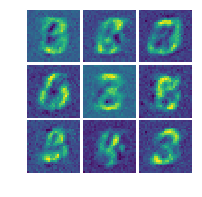

2018-05-17 23:15:58 iteration 37000/50000: current training loss = 42.640167 (=1.052347+0.304421+41.283398)


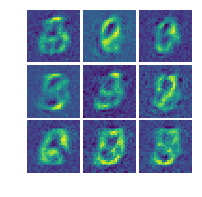

2018-05-17 23:16:08 iteration 37100/50000: current training loss = 18.050539 (=1.248069+0.419163+16.383307)


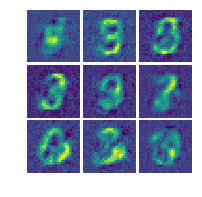

2018-05-17 23:16:18 iteration 37200/50000: current training loss = 93.147171 (=1.365020+0.335587+91.446564)


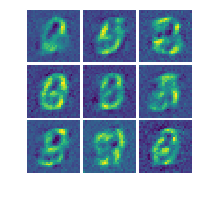

2018-05-17 23:16:27 iteration 37300/50000: current training loss = 65.052330 (=1.776988+0.381323+62.894016)


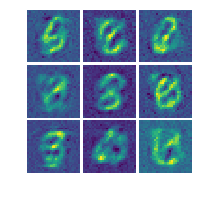

2018-05-17 23:16:37 iteration 37400/50000: current training loss = 135.832397 (=1.315490+0.293830+134.223083)


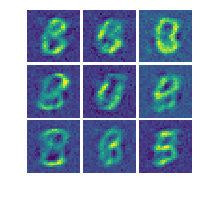

2018-05-17 23:16:47 iteration 37500/50000: current training loss = 75.642052 (=1.478656+0.284160+73.879234)


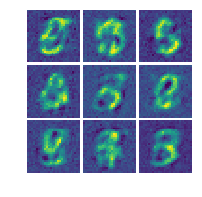

2018-05-17 23:16:56 iteration 37600/50000: current training loss = 63.776440 (=1.511760+0.304807+61.959873)


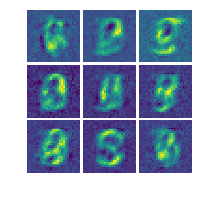

2018-05-17 23:17:06 iteration 37700/50000: current training loss = 56.489407 (=1.300622+0.306335+54.882450)


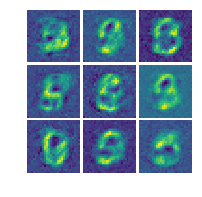

2018-05-17 23:17:16 iteration 37800/50000: current training loss = 51.647110 (=1.161161+0.358075+50.127872)


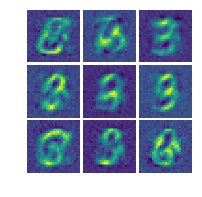

2018-05-17 23:17:26 iteration 37900/50000: current training loss = 96.401237 (=1.074079+0.454977+94.872185)


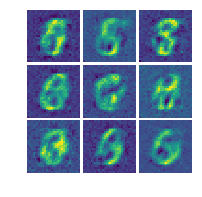

2018-05-17 23:17:35 iteration 38000/50000: current training loss = 40.085770 (=1.306051+0.327443+38.452274)


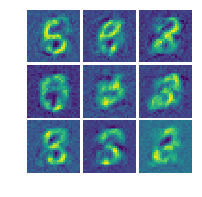

2018-05-17 23:17:45 iteration 38100/50000: current training loss = 66.742195 (=1.349583+0.340818+65.051796)


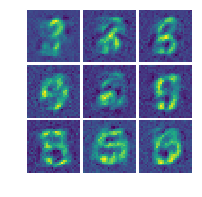

2018-05-17 23:17:55 iteration 38200/50000: current training loss = 66.442451 (=1.357708+0.302029+64.782715)


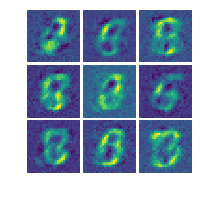

2018-05-17 23:18:05 iteration 38300/50000: current training loss = 48.261662 (=1.605174+0.308822+46.347668)


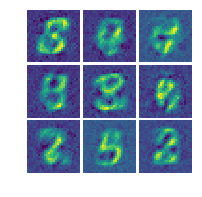

2018-05-17 23:18:14 iteration 38400/50000: current training loss = 72.203072 (=1.524783+0.352505+70.325783)


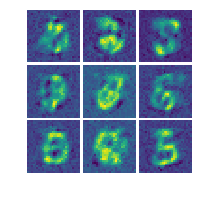

2018-05-17 23:18:24 iteration 38500/50000: current training loss = 25.938744 (=1.340303+0.297584+24.300858)


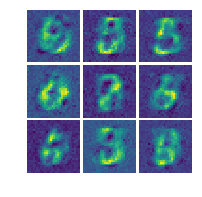

2018-05-17 23:18:34 iteration 38600/50000: current training loss = 59.125832 (=1.383378+0.326608+57.415844)


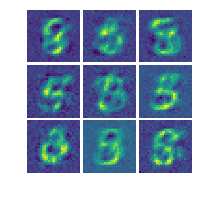

2018-05-17 23:18:43 iteration 38700/50000: current training loss = 44.859726 (=1.672573+0.323942+42.863209)


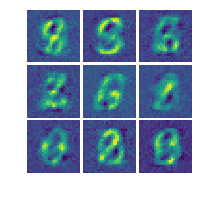

2018-05-17 23:18:53 iteration 38800/50000: current training loss = 69.832298 (=0.763462+0.303593+68.765244)


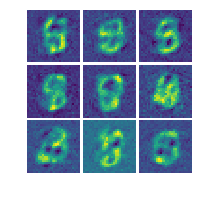

2018-05-17 23:19:03 iteration 38900/50000: current training loss = 80.242470 (=1.612442+0.327484+78.302544)


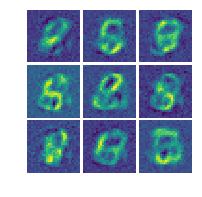

2018-05-17 23:19:13 iteration 39000/50000: current training loss = 75.048058 (=1.207555+0.327329+73.513176)


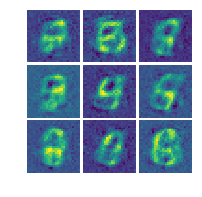

2018-05-17 23:19:22 iteration 39100/50000: current training loss = 88.353600 (=1.063244+0.287118+87.003235)


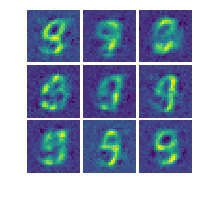

2018-05-17 23:19:32 iteration 39200/50000: current training loss = 92.249168 (=1.370678+0.300603+90.577888)


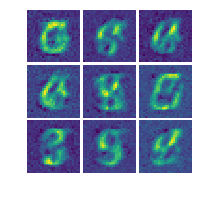

2018-05-17 23:19:42 iteration 39300/50000: current training loss = 100.993111 (=1.697925+0.302854+98.992332)


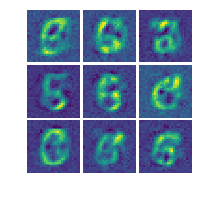

2018-05-17 23:19:52 iteration 39400/50000: current training loss = 39.490601 (=1.165412+0.325647+37.999542)


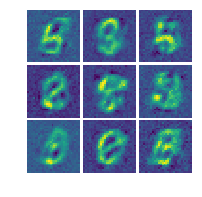

2018-05-17 23:20:02 iteration 39500/50000: current training loss = 55.136234 (=1.124158+0.358084+53.653992)


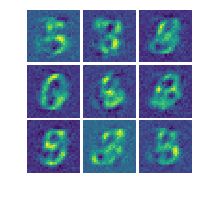

2018-05-17 23:20:11 iteration 39600/50000: current training loss = 59.741009 (=1.238030+0.381163+58.121815)


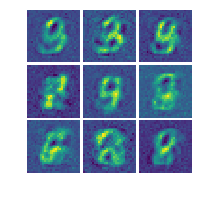

2018-05-17 23:20:21 iteration 39700/50000: current training loss = 63.890678 (=1.012817+0.318782+62.559078)


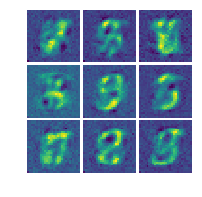

2018-05-17 23:20:31 iteration 39800/50000: current training loss = 65.655212 (=0.989771+0.371013+64.294426)


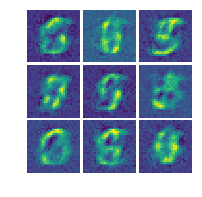

2018-05-17 23:20:40 iteration 39900/50000: current training loss = 32.985260 (=1.368990+0.327893+31.288378)


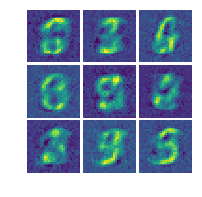

2018-05-17 23:20:50 iteration 40000/50000: current training loss = 42.885361 (=1.586220+0.335801+40.963341)


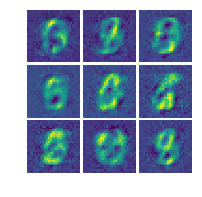

2018-05-17 23:21:00 iteration 40100/50000: current training loss = 100.641045 (=1.182191+0.365524+99.093330)


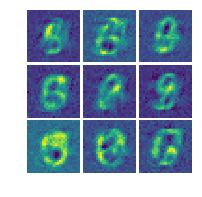

2018-05-17 23:21:09 iteration 40200/50000: current training loss = 59.770626 (=1.492359+0.309328+57.968937)


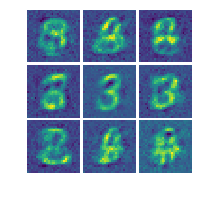

2018-05-17 23:21:19 iteration 40300/50000: current training loss = 67.328331 (=1.352884+0.326597+65.648849)


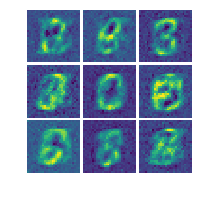

2018-05-17 23:21:28 iteration 40400/50000: current training loss = 53.877754 (=1.385743+0.359214+52.132797)


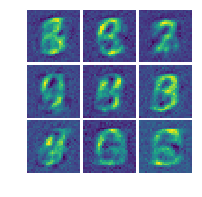

2018-05-17 23:21:38 iteration 40500/50000: current training loss = 35.440742 (=1.152420+0.327561+33.960762)


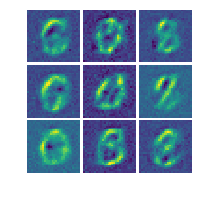

2018-05-17 23:21:48 iteration 40600/50000: current training loss = 60.312668 (=1.413595+0.318647+58.580425)


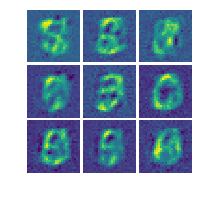

2018-05-17 23:21:57 iteration 40700/50000: current training loss = 30.811630 (=1.233378+0.312407+29.265846)


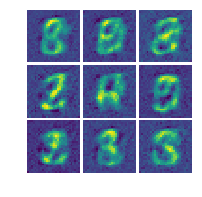

2018-05-17 23:22:07 iteration 40800/50000: current training loss = 23.012859 (=1.408777+0.337616+21.266466)


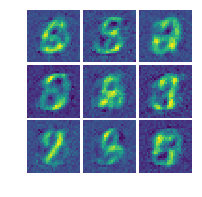

2018-05-17 23:22:17 iteration 40900/50000: current training loss = 56.572735 (=1.274337+0.355424+54.942974)


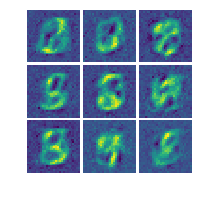

2018-05-17 23:22:27 iteration 41000/50000: current training loss = 34.402916 (=0.956467+0.456870+32.989578)


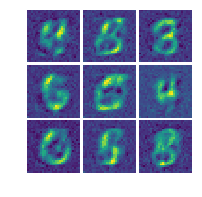

2018-05-17 23:22:36 iteration 41100/50000: current training loss = 36.149406 (=1.419943+0.358786+34.370678)


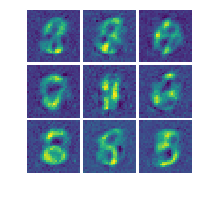

2018-05-17 23:22:46 iteration 41200/50000: current training loss = 37.831459 (=1.445006+0.365353+36.021099)


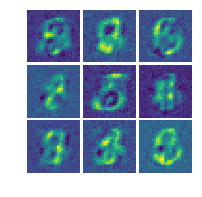

2018-05-17 23:22:55 iteration 41300/50000: current training loss = 35.869530 (=1.575835+0.345166+33.948528)


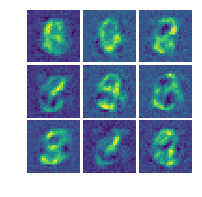

2018-05-17 23:23:05 iteration 41400/50000: current training loss = 40.908810 (=1.476315+0.341278+39.091217)


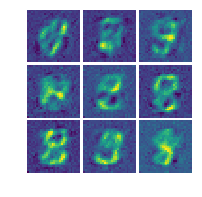

2018-05-17 23:23:14 iteration 41500/50000: current training loss = 41.647156 (=2.080687+0.621055+38.945415)


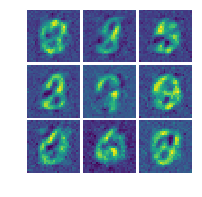

2018-05-17 23:23:24 iteration 41600/50000: current training loss = 25.998608 (=1.352629+0.347120+24.298859)


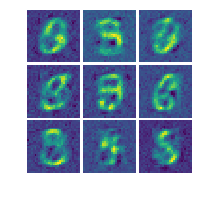

2018-05-17 23:23:34 iteration 41700/50000: current training loss = 64.708267 (=1.699686+0.360023+62.648560)


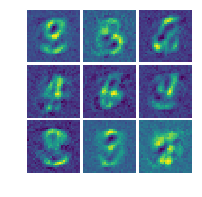

2018-05-17 23:23:43 iteration 41800/50000: current training loss = 16.823503 (=1.702433+0.337322+14.783749)


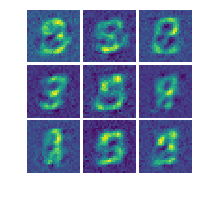

2018-05-17 23:23:53 iteration 41900/50000: current training loss = 69.712715 (=1.586178+0.373670+67.752869)


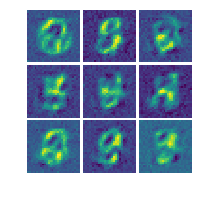

2018-05-17 23:24:02 iteration 42000/50000: current training loss = 42.365299 (=1.976426+0.370932+40.017941)


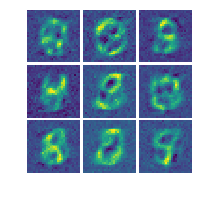

2018-05-17 23:24:12 iteration 42100/50000: current training loss = 53.845154 (=1.363203+0.332500+52.149448)


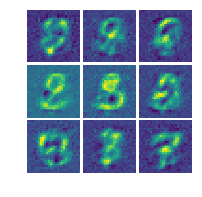

2018-05-17 23:24:22 iteration 42200/50000: current training loss = 46.957214 (=1.318910+0.342852+45.295452)


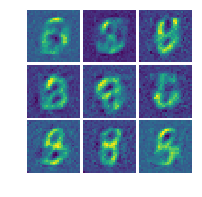

2018-05-17 23:24:31 iteration 42300/50000: current training loss = 96.294380 (=1.562445+0.372077+94.359856)


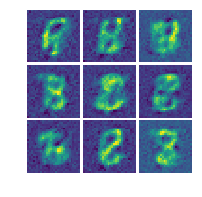

2018-05-17 23:24:41 iteration 42400/50000: current training loss = 52.262455 (=1.240732+0.332068+50.689655)


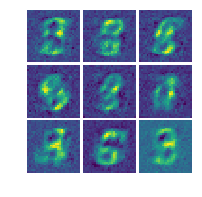

2018-05-17 23:24:51 iteration 42500/50000: current training loss = 32.582577 (=1.556948+0.409190+30.616438)


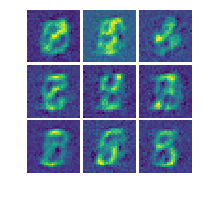

2018-05-17 23:25:01 iteration 42600/50000: current training loss = 61.145500 (=1.459095+0.343225+59.343182)


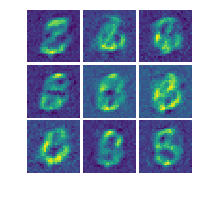

2018-05-17 23:25:11 iteration 42700/50000: current training loss = 71.142220 (=2.022278+0.274810+68.845131)


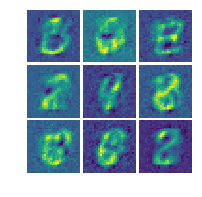

2018-05-17 23:25:20 iteration 42800/50000: current training loss = 148.234924 (=1.532287+0.477175+146.225464)


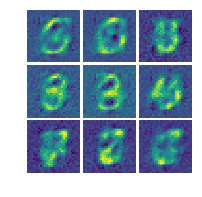

2018-05-17 23:25:30 iteration 42900/50000: current training loss = 84.958641 (=1.547729+0.322307+83.088608)


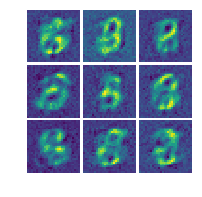

2018-05-17 23:25:40 iteration 43000/50000: current training loss = 35.791191 (=1.371561+0.342897+34.076733)


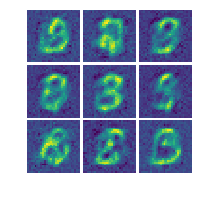

2018-05-17 23:25:50 iteration 43100/50000: current training loss = 81.293495 (=1.580800+0.415272+79.297424)


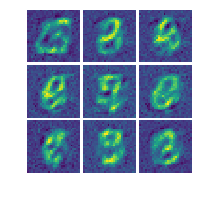

2018-05-17 23:25:59 iteration 43200/50000: current training loss = 144.691574 (=1.728323+0.409374+142.553879)


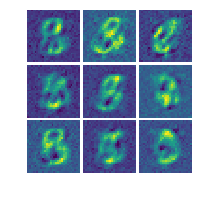

2018-05-17 23:26:09 iteration 43300/50000: current training loss = 61.149971 (=1.227999+0.313723+59.608250)


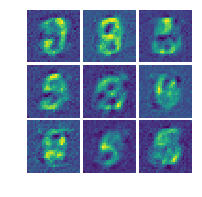

2018-05-17 23:26:18 iteration 43400/50000: current training loss = 166.480240 (=1.358921+0.324759+164.796555)


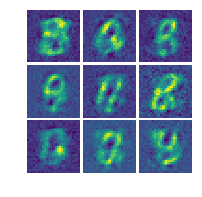

2018-05-17 23:26:28 iteration 43500/50000: current training loss = 63.237968 (=1.950590+0.344429+60.942951)


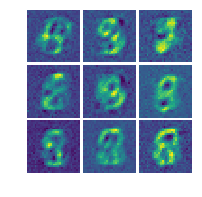

2018-05-17 23:26:37 iteration 43600/50000: current training loss = 162.488205 (=1.413240+0.315465+160.759506)


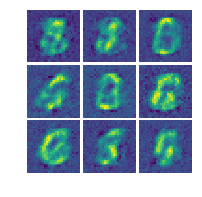

2018-05-17 23:26:47 iteration 43700/50000: current training loss = 204.538406 (=1.543677+0.363379+202.631348)


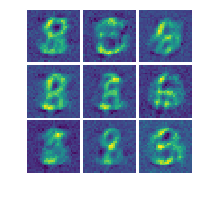

2018-05-17 23:26:56 iteration 43800/50000: current training loss = 57.689423 (=1.158630+0.335236+56.195557)


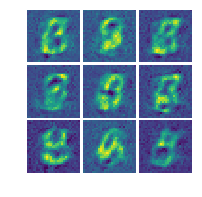

2018-05-17 23:27:06 iteration 43900/50000: current training loss = 80.192978 (=1.582852+0.391487+78.218643)


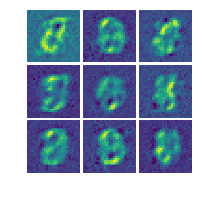

2018-05-17 23:27:15 iteration 44000/50000: current training loss = 42.112247 (=1.765578+0.380318+39.966351)


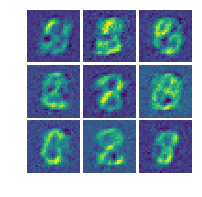

2018-05-17 23:27:25 iteration 44100/50000: current training loss = 65.369247 (=1.448256+0.411886+63.509106)


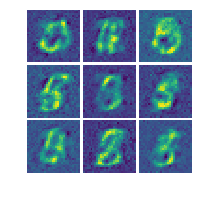

2018-05-17 23:27:34 iteration 44200/50000: current training loss = 31.417276 (=1.139507+0.353957+29.923813)


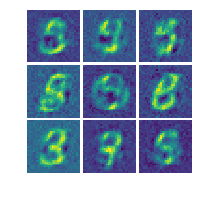

2018-05-17 23:27:44 iteration 44300/50000: current training loss = 21.495289 (=2.396955+0.362760+18.735573)


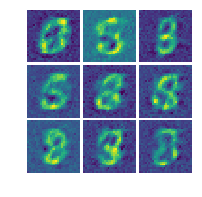

2018-05-17 23:27:53 iteration 44400/50000: current training loss = 96.091042 (=1.850368+0.335180+93.905495)


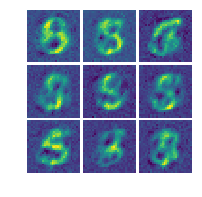

2018-05-17 23:28:03 iteration 44500/50000: current training loss = 204.860413 (=1.629110+0.378710+202.852585)


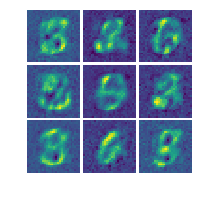

2018-05-17 23:28:12 iteration 44600/50000: current training loss = 108.161026 (=1.261192+0.359284+106.540550)


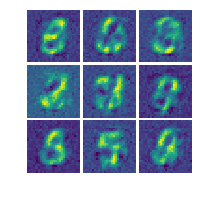

2018-05-17 23:28:22 iteration 44700/50000: current training loss = 65.612091 (=1.537863+0.341248+63.732983)


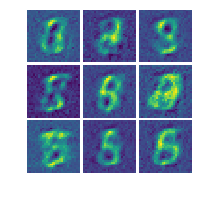

2018-05-17 23:28:31 iteration 44800/50000: current training loss = 59.723190 (=1.505496+0.396377+57.821316)


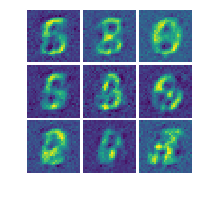

2018-05-17 23:28:41 iteration 44900/50000: current training loss = 31.077282 (=2.307949+0.331628+28.437706)


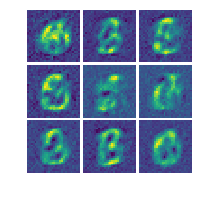

2018-05-17 23:28:50 iteration 45000/50000: current training loss = 58.209709 (=1.119463+0.326701+56.763546)


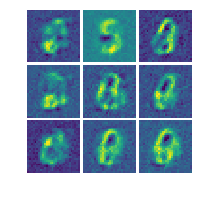

2018-05-17 23:28:59 iteration 45100/50000: current training loss = 60.377792 (=1.153303+0.358665+58.865826)


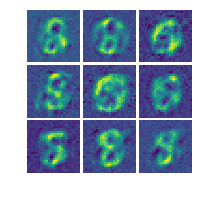

2018-05-17 23:29:08 iteration 45200/50000: current training loss = 65.336639 (=1.784626+0.345461+63.206554)


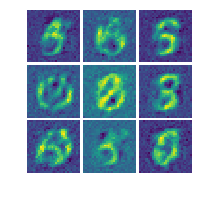

2018-05-17 23:29:18 iteration 45300/50000: current training loss = 50.555126 (=1.204735+0.351507+48.998886)


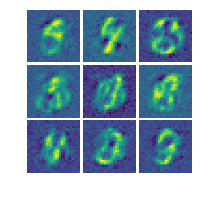

2018-05-17 23:29:28 iteration 45400/50000: current training loss = 143.823776 (=1.831663+0.340152+141.651962)


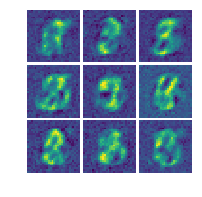

2018-05-17 23:29:37 iteration 45500/50000: current training loss = 102.037384 (=1.550372+0.368295+100.118713)


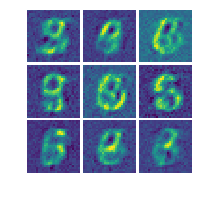

2018-05-17 23:29:47 iteration 45600/50000: current training loss = 54.221615 (=1.645149+0.364932+52.211533)


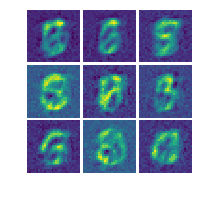

2018-05-17 23:29:57 iteration 45700/50000: current training loss = 70.798096 (=1.590859+0.383896+68.823341)


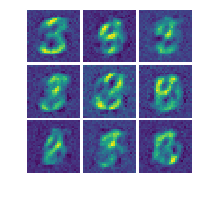

2018-05-17 23:30:06 iteration 45800/50000: current training loss = 57.049477 (=1.802848+0.345064+54.901566)


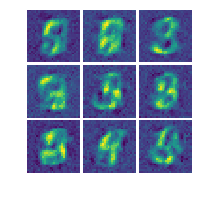

2018-05-17 23:30:16 iteration 45900/50000: current training loss = 43.143398 (=1.657874+0.419521+41.066006)


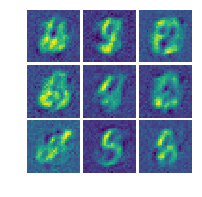

2018-05-17 23:30:25 iteration 46000/50000: current training loss = 82.602425 (=2.155622+0.325841+80.120964)


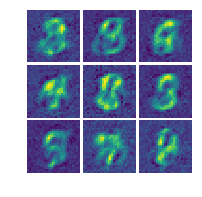

2018-05-17 23:30:35 iteration 46100/50000: current training loss = 33.492439 (=1.574875+0.342969+31.574594)


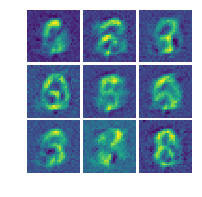

2018-05-17 23:30:45 iteration 46200/50000: current training loss = 89.655151 (=1.214014+0.352963+88.088173)


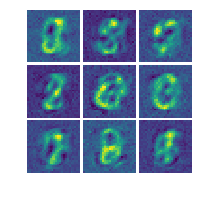

2018-05-17 23:30:54 iteration 46300/50000: current training loss = 26.035961 (=2.244040+0.378159+23.413763)


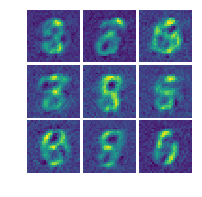

2018-05-17 23:31:04 iteration 46400/50000: current training loss = 40.624416 (=1.593120+0.308086+38.723209)


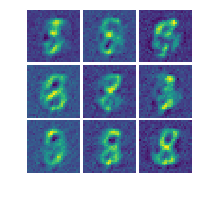

2018-05-17 23:31:14 iteration 46500/50000: current training loss = 87.663651 (=1.976839+0.385672+85.301140)


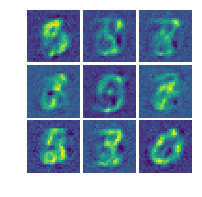

2018-05-17 23:31:24 iteration 46600/50000: current training loss = 26.125050 (=1.197447+0.388098+24.539503)


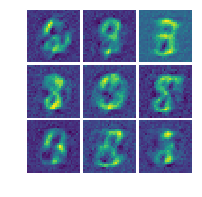

2018-05-17 23:31:33 iteration 46700/50000: current training loss = 22.222120 (=2.483375+0.437607+19.301138)


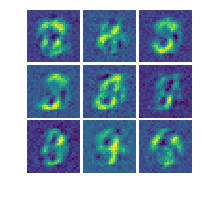

2018-05-17 23:31:43 iteration 46800/50000: current training loss = 31.631201 (=2.360331+0.371614+28.899256)


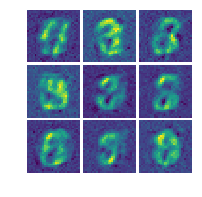

2018-05-17 23:31:53 iteration 46900/50000: current training loss = 72.255768 (=1.659851+0.343104+70.252815)


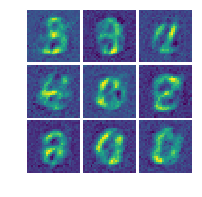

2018-05-17 23:32:03 iteration 47000/50000: current training loss = 49.766888 (=1.741883+0.334636+47.690369)


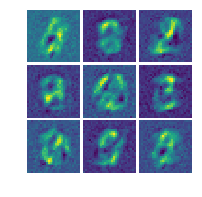

2018-05-17 23:32:13 iteration 47100/50000: current training loss = 38.316875 (=1.696055+0.377439+36.243382)


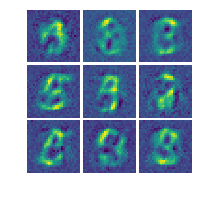

2018-05-17 23:32:23 iteration 47200/50000: current training loss = 76.448250 (=1.631873+0.398535+74.417839)


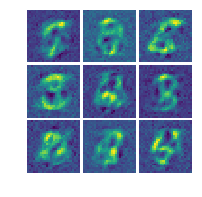

2018-05-17 23:32:32 iteration 47300/50000: current training loss = 27.612724 (=1.668718+0.396180+25.547827)


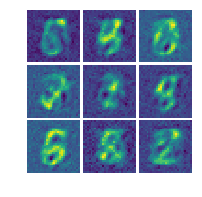

2018-05-17 23:32:42 iteration 47400/50000: current training loss = 24.402306 (=0.787571+0.357980+23.256754)


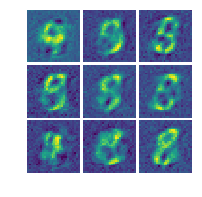

2018-05-17 23:32:52 iteration 47500/50000: current training loss = 37.032444 (=1.627467+0.552799+34.852177)


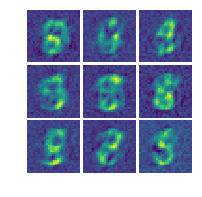

2018-05-17 23:33:02 iteration 47600/50000: current training loss = 27.162018 (=1.107623+0.433634+25.620760)


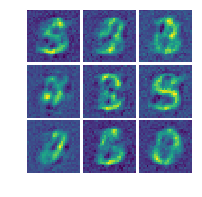

2018-05-17 23:33:11 iteration 47700/50000: current training loss = 40.355110 (=1.386272+0.374603+38.594234)


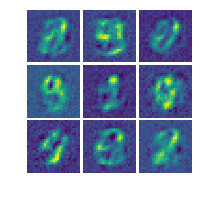

2018-05-17 23:33:21 iteration 47800/50000: current training loss = 61.407536 (=1.883487+0.355031+59.169018)


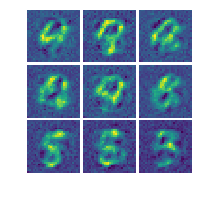

2018-05-17 23:33:31 iteration 47900/50000: current training loss = 54.933613 (=1.095253+0.353913+53.484447)


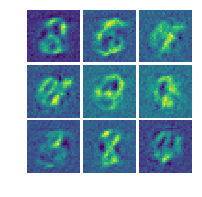

2018-05-17 23:33:41 iteration 48000/50000: current training loss = 17.842587 (=1.707437+0.396679+15.738469)


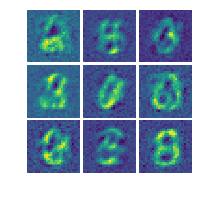

2018-05-17 23:33:51 iteration 48100/50000: current training loss = 35.391243 (=1.452457+0.384630+33.554157)


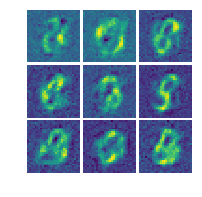

2018-05-17 23:34:01 iteration 48200/50000: current training loss = 18.911217 (=1.287286+0.363444+17.260487)


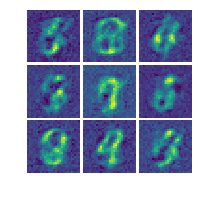

2018-05-17 23:34:11 iteration 48300/50000: current training loss = 33.163662 (=2.188416+0.319225+30.656021)


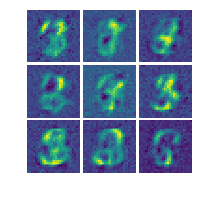

2018-05-17 23:34:20 iteration 48400/50000: current training loss = 22.018137 (=1.778914+0.336874+19.902349)


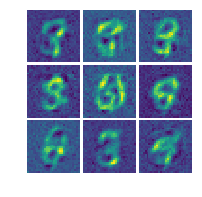

2018-05-17 23:34:30 iteration 48500/50000: current training loss = 22.809490 (=1.298782+0.368987+21.141722)


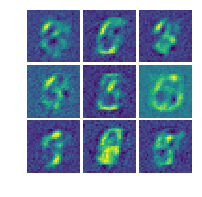

2018-05-17 23:34:40 iteration 48600/50000: current training loss = 26.344234 (=2.045494+0.366178+23.932562)


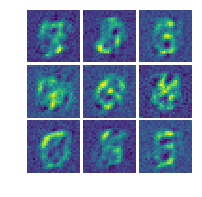

2018-05-17 23:34:49 iteration 48700/50000: current training loss = 45.948597 (=1.581641+0.417987+43.948971)


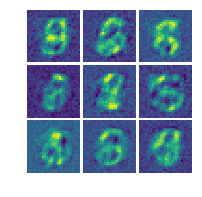

2018-05-17 23:34:59 iteration 48800/50000: current training loss = 25.830456 (=1.424316+0.399998+24.006144)


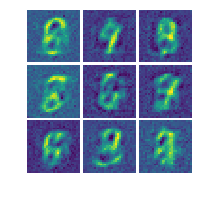

2018-05-17 23:35:09 iteration 48900/50000: current training loss = 19.741484 (=1.260148+0.369734+18.111601)


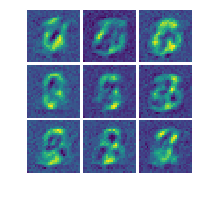

2018-05-17 23:35:18 iteration 49000/50000: current training loss = 33.320850 (=1.513929+0.385544+31.421377)


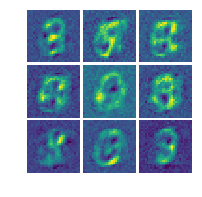

2018-05-17 23:35:28 iteration 49100/50000: current training loss = 35.382088 (=1.531218+0.344008+33.506863)


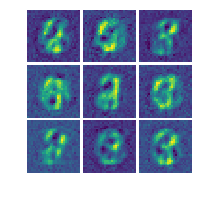

2018-05-17 23:35:38 iteration 49200/50000: current training loss = 31.047932 (=2.705862+0.347016+27.995054)


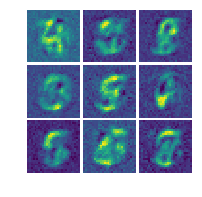

2018-05-17 23:35:47 iteration 49300/50000: current training loss = 41.991867 (=1.605912+0.370082+40.015873)


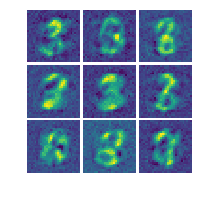

2018-05-17 23:35:57 iteration 49400/50000: current training loss = 26.225315 (=1.391539+0.332814+24.500963)


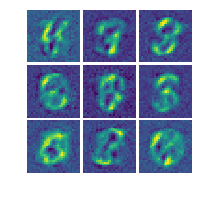

2018-05-17 23:36:07 iteration 49500/50000: current training loss = 26.692945 (=1.209985+0.335821+25.147139)


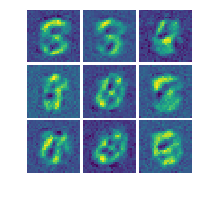

2018-05-17 23:36:16 iteration 49600/50000: current training loss = 38.379646 (=2.378997+0.479999+35.520649)


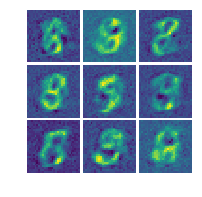

2018-05-17 23:36:26 iteration 49700/50000: current training loss = 53.371101 (=1.691930+0.378225+51.300945)


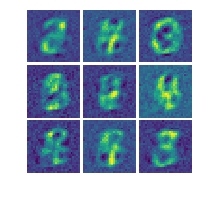

2018-05-17 23:36:36 iteration 49800/50000: current training loss = 61.822529 (=1.956049+0.420120+59.446362)


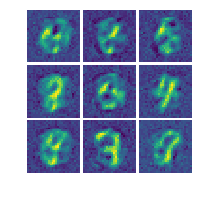

2018-05-17 23:36:46 iteration 49900/50000: current training loss = 35.232265 (=1.330433+0.344932+33.556900)


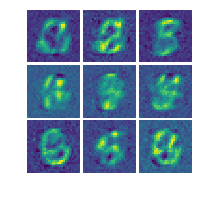

2018-05-17 23:36:56 iteration 50000/50000: current training loss = 37.929501 (=1.247220+0.385261+36.297020)


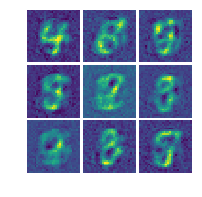

In [8]:
batch_size=256
fake_size=256
noise_size=256
num_iteration=50000
print_every=100
test_every=100


classifier_train=2
vae_train=1

with tf.Session() as sess:
    tf.global_variables_initializer().run()
    for it in range(num_iteration):
        image,label=make_batch_new(batch_size,fake_size)
        feed_dict={X:image,y:label}
        loss_num,l1,l2,l3=sess.run([tot_loss,tot_latent_loss,tot_classifier_loss,tot_likelihood_loss],feed_dict=feed_dict)
        for t in range(classifier_train):
#             _,__=sess.run([train_step1,extra_update_ops],feed_dict={X:image,y:label})
            _=sess.run([train_step1],feed_dict={X:image,y:label})
        for t in range(vae_train):
            _=sess.run([train_step2],feed_dict={X:image,y:label})
        
        if it==0 or (it+1)%print_every==0 or it==num_iteration-1:
            print(time.strftime('%Y-%m-%d %H:%M:%S',time.localtime(time.time())),
                  'iteration %d/%d:' % (it+1,num_iteration),'current training loss = %f (=%f+%f+%f)' % (loss_num,l1,l2,l3))
        
        if it==0 or (it+1)%test_every==0 or it==num_iteration-1:
            display()
            
        if it>=1000:
            classifier_train=1
            vae_train=1
            
    